In [1]:
import numpy as np

import pandas as pd

import os as o

import sys as ss

import csv as cv

import json as jayz

#import lxml as xml Not working ecen though it is installed


import requests

import sqlite3

# import sqlalchemy as sqa , not working even though installed


import re

import matplotlib.pyplot as plt

from datetime import datetime  as datetm 

from datetime import timedelta as tdel

import seaborn as sns

# Now if you want to do the plotting in pycharm, remember that no matter which method you use the figure output will
# not come unless until you write plt.show()


from io import StringIO

import pytz

import json as the_son


## Bitly Data from 1.USA.gov

In [2]:
# Here we will see how JSON data can be read and worked upon by various libraries in python

In [3]:
paths = 'datasets/bitly_usagov/example.txt'

In [4]:
fo = open(paths,'r+')

print(fo.readline())

fo.close()

{ "a": "Mozilla\/5.0 (Windows NT 6.1; WOW64) AppleWebKit\/535.11 (KHTML, like Gecko) Chrome\/17.0.963.78 Safari\/535.11", "c": "US", "nk": 1, "tz": "America\/New_York", "gr": "MA", "g": "A6qOVH", "h": "wfLQtf", "l": "orofrog", "al": "en-US,en;q=0.8", "hh": "1.usa.gov", "r": "http:\/\/www.facebook.com\/l\/7AQEFzjSi\/1.usa.gov\/wfLQtf", "u": "http:\/\/www.ncbi.nlm.nih.gov\/pubmed\/22415991", "t": 1331923247, "hc": 1331822918, "cy": "Danvers", "ll": [ 42.576698, -70.954903 ] }



In [5]:
# Now, python has both built-in and third party libraries for converting json string to python dictionary

In [6]:
fo = open(paths,'r+')

recorder = [the_son.loads(line) for line in fo]

print(recorder)

print(recorder[0])

recorder[0]['tz']

# what we see here is a list of python dictionaries

[{'a': 'Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/535.11 (KHTML, like Gecko) Chrome/17.0.963.78 Safari/535.11', 'c': 'US', 'nk': 1, 'tz': 'America/New_York', 'gr': 'MA', 'g': 'A6qOVH', 'h': 'wfLQtf', 'l': 'orofrog', 'al': 'en-US,en;q=0.8', 'hh': '1.usa.gov', 'r': 'http://www.facebook.com/l/7AQEFzjSi/1.usa.gov/wfLQtf', 'u': 'http://www.ncbi.nlm.nih.gov/pubmed/22415991', 't': 1331923247, 'hc': 1331822918, 'cy': 'Danvers', 'll': [42.576698, -70.954903]}, {'a': 'GoogleMaps/RochesterNY', 'c': 'US', 'nk': 0, 'tz': 'America/Denver', 'gr': 'UT', 'g': 'mwszkS', 'h': 'mwszkS', 'l': 'bitly', 'hh': 'j.mp', 'r': 'http://www.AwareMap.com/', 'u': 'http://www.monroecounty.gov/etc/911/rss.php', 't': 1331923249, 'hc': 1308262393, 'cy': 'Provo', 'll': [40.218102, -111.613297]}, {'a': 'Mozilla/4.0 (compatible; MSIE 8.0; Windows NT 6.1; WOW64; Trident/4.0; SLCC2; .NET CLR 2.0.50727; .NET CLR 3.5.30729; .NET CLR 3.0.30729; Media Center PC 6.0; .NET4.0C; .NET4.0E; InfoPath.3)', 'c': 'US', 'nk': 1, 'tz'

'America/New_York'

### Counting Time Zones in Pure Python

In [7]:
ls = [1,22,33,{'aaha':131},['dds',65],{2:'chunn'}]

for j in ls:
    print(j)
    print(type(j))

1
<class 'int'>
22
<class 'int'>
33
<class 'int'>
{'aaha': 131}
<class 'dict'>
['dds', 65]
<class 'list'>
{2: 'chunn'}
<class 'dict'>


In [8]:
# Now suppose we wanted to find the timezone that occur most in the field, then we use the tz field of the dataset


In [9]:
#for j in recorder:
    #print(j['tz'])
    
# well not all the dictionaries have tz so we can put a check condition

In [10]:
time_zones = [te_zs['tz'] for te_zs in recorder if 'tz' in te_zs]

time_zones

# one slight note. The if condition will work only if all the key data is of one datatype only

['America/New_York',
 'America/Denver',
 'America/New_York',
 'America/Sao_Paulo',
 'America/New_York',
 'America/New_York',
 'Europe/Warsaw',
 '',
 '',
 '',
 'America/Los_Angeles',
 'America/New_York',
 'America/New_York',
 'America/New_York',
 'Asia/Hong_Kong',
 'Asia/Hong_Kong',
 'America/New_York',
 'America/Denver',
 'Europe/Rome',
 'Africa/Ceuta',
 'America/New_York',
 'America/New_York',
 'America/New_York',
 'Europe/Madrid',
 'Asia/Kuala_Lumpur',
 'Asia/Nicosia',
 'America/Sao_Paulo',
 '',
 '',
 'Europe/London',
 'America/New_York',
 'Pacific/Honolulu',
 'America/Chicago',
 '',
 '',
 'Pacific/Honolulu',
 '',
 'America/New_York',
 'America/New_York',
 'America/New_York',
 'America/Chicago',
 'Europe/Rome',
 'America/New_York',
 'America/New_York',
 'America/Los_Angeles',
 '',
 '',
 'America/New_York',
 'America/New_York',
 'Europe/Malta',
 'America/New_York',
 'America/New_York',
 '',
 'America/Los_Angeles',
 'America/Sao_Paulo',
 '',
 'Asia/Hong_Kong',
 'Asia/Hong_Kong',
 'Paci

In [11]:
# Now we will see how to find the counts of each timezones by two methods

In [12]:
# standard method

def get_count_std(tizo):
    counts = {}
    for x in tizo:
        if x in counts:
            counts[x] += 1
        else:
            counts[x] = 1
    return counts

In [13]:
# Advanced method

from collections import defaultdict # this is used for initializing values of a dictionary to zeroes

def get_counts_adv(tizo):
    counts = defaultdict(int) # count dictionary has been created with default values at zero
    for x in tizo:
        counts[x] +=1
    return counts

In [14]:
from collections import defaultdict
cs = defaultdict(int)

cs

defaultdict(int, {})

In [15]:
res_std = get_count_std(time_zones)

res_std

{'America/New_York': 1251,
 'America/Denver': 191,
 'America/Sao_Paulo': 33,
 'Europe/Warsaw': 16,
 '': 521,
 'America/Los_Angeles': 382,
 'Asia/Hong_Kong': 10,
 'Europe/Rome': 27,
 'Africa/Ceuta': 2,
 'Europe/Madrid': 35,
 'Asia/Kuala_Lumpur': 3,
 'Asia/Nicosia': 1,
 'Europe/London': 74,
 'Pacific/Honolulu': 36,
 'America/Chicago': 400,
 'Europe/Malta': 2,
 'Europe/Lisbon': 8,
 'Europe/Paris': 14,
 'Europe/Copenhagen': 5,
 'America/Mazatlan': 1,
 'Europe/Dublin': 3,
 'Europe/Brussels': 4,
 'America/Vancouver': 12,
 'Europe/Amsterdam': 22,
 'Europe/Prague': 10,
 'Europe/Stockholm': 14,
 'America/Anchorage': 5,
 'Asia/Bangkok': 6,
 'Europe/Berlin': 28,
 'America/Rainy_River': 25,
 'Europe/Budapest': 5,
 'Asia/Tokyo': 37,
 'Europe/Vienna': 6,
 'America/Phoenix': 20,
 'Asia/Jerusalem': 3,
 'Asia/Karachi': 3,
 'America/Bogota': 3,
 'America/Indianapolis': 20,
 'America/Montreal': 9,
 'Asia/Calcutta': 9,
 'Europe/Skopje': 1,
 'Asia/Beirut': 4,
 'Australia/NSW': 6,
 'Chile/Continental': 6,
 

In [16]:
res_adv = get_counts_adv(time_zones)

res_adv

defaultdict(int,
            {'America/New_York': 1251,
             'America/Denver': 191,
             'America/Sao_Paulo': 33,
             'Europe/Warsaw': 16,
             '': 521,
             'America/Los_Angeles': 382,
             'Asia/Hong_Kong': 10,
             'Europe/Rome': 27,
             'Africa/Ceuta': 2,
             'Europe/Madrid': 35,
             'Asia/Kuala_Lumpur': 3,
             'Asia/Nicosia': 1,
             'Europe/London': 74,
             'Pacific/Honolulu': 36,
             'America/Chicago': 400,
             'Europe/Malta': 2,
             'Europe/Lisbon': 8,
             'Europe/Paris': 14,
             'Europe/Copenhagen': 5,
             'America/Mazatlan': 1,
             'Europe/Dublin': 3,
             'Europe/Brussels': 4,
             'America/Vancouver': 12,
             'Europe/Amsterdam': 22,
             'Europe/Prague': 10,
             'Europe/Stockholm': 14,
             'America/Anchorage': 5,
             'Asia/Bangkok': 6,
         

In [17]:
dk = [22,333,1221,223322,122222112,99997787788,45677888877788]

print(dk[-4:])

[223322, 122222112, 99997787788, 45677888877788]


In [18]:
oue = [(22,'aaha en'),(442,'mman'),(2,'orr'),(0,'nahhe'),(4343,'ohh ue'),(32,'nnaa')]

oue.sort()

oue

[(0, 'nahhe'),
 (2, 'orr'),
 (22, 'aaha en'),
 (32, 'nnaa'),
 (442, 'mman'),
 (4343, 'ohh ue')]

In [19]:
# Now suppose you wanted the top ten most occuring timezones with number so for that

In [20]:
res_adv.items()

dict_items([('America/New_York', 1251), ('America/Denver', 191), ('America/Sao_Paulo', 33), ('Europe/Warsaw', 16), ('', 521), ('America/Los_Angeles', 382), ('Asia/Hong_Kong', 10), ('Europe/Rome', 27), ('Africa/Ceuta', 2), ('Europe/Madrid', 35), ('Asia/Kuala_Lumpur', 3), ('Asia/Nicosia', 1), ('Europe/London', 74), ('Pacific/Honolulu', 36), ('America/Chicago', 400), ('Europe/Malta', 2), ('Europe/Lisbon', 8), ('Europe/Paris', 14), ('Europe/Copenhagen', 5), ('America/Mazatlan', 1), ('Europe/Dublin', 3), ('Europe/Brussels', 4), ('America/Vancouver', 12), ('Europe/Amsterdam', 22), ('Europe/Prague', 10), ('Europe/Stockholm', 14), ('America/Anchorage', 5), ('Asia/Bangkok', 6), ('Europe/Berlin', 28), ('America/Rainy_River', 25), ('Europe/Budapest', 5), ('Asia/Tokyo', 37), ('Europe/Vienna', 6), ('America/Phoenix', 20), ('Asia/Jerusalem', 3), ('Asia/Karachi', 3), ('America/Bogota', 3), ('America/Indianapolis', 20), ('America/Montreal', 9), ('Asia/Calcutta', 9), ('Europe/Skopje', 1), ('Asia/Beirut

In [21]:
def top_tens(data,n= 10):
    topG = [ (count,tz)   for tz,count in data.items()]
    topG.sort()
    return topG[-n:]

In [22]:
tote = top_tens(res_adv)

tote

[(33, 'America/Sao_Paulo'),
 (35, 'Europe/Madrid'),
 (36, 'Pacific/Honolulu'),
 (37, 'Asia/Tokyo'),
 (74, 'Europe/London'),
 (191, 'America/Denver'),
 (382, 'America/Los_Angeles'),
 (400, 'America/Chicago'),
 (521, ''),
 (1251, 'America/New_York')]

In [23]:
# Now there is obviously a much lightning fast trail-blazing method

In [24]:
from collections import Counter as cc

In [25]:
toptenCounts = cc(res_adv)

toptenCounts.most_common(10)

[('America/New_York', 1251),
 ('', 521),
 ('America/Chicago', 400),
 ('America/Los_Angeles', 382),
 ('America/Denver', 191),
 ('Europe/London', 74),
 ('Asia/Tokyo', 37),
 ('Pacific/Honolulu', 36),
 ('Europe/Madrid', 35),
 ('America/Sao_Paulo', 33)]

### Counting Time Zones with Pandas

In [26]:
recorder

[{'a': 'Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/535.11 (KHTML, like Gecko) Chrome/17.0.963.78 Safari/535.11',
  'c': 'US',
  'nk': 1,
  'tz': 'America/New_York',
  'gr': 'MA',
  'g': 'A6qOVH',
  'h': 'wfLQtf',
  'l': 'orofrog',
  'al': 'en-US,en;q=0.8',
  'hh': '1.usa.gov',
  'r': 'http://www.facebook.com/l/7AQEFzjSi/1.usa.gov/wfLQtf',
  'u': 'http://www.ncbi.nlm.nih.gov/pubmed/22415991',
  't': 1331923247,
  'hc': 1331822918,
  'cy': 'Danvers',
  'll': [42.576698, -70.954903]},
 {'a': 'GoogleMaps/RochesterNY',
  'c': 'US',
  'nk': 0,
  'tz': 'America/Denver',
  'gr': 'UT',
  'g': 'mwszkS',
  'h': 'mwszkS',
  'l': 'bitly',
  'hh': 'j.mp',
  'r': 'http://www.AwareMap.com/',
  'u': 'http://www.monroecounty.gov/etc/911/rss.php',
  't': 1331923249,
  'hc': 1308262393,
  'cy': 'Provo',
  'll': [40.218102, -111.613297]},
 {'a': 'Mozilla/4.0 (compatible; MSIE 8.0; Windows NT 6.1; WOW64; Trident/4.0; SLCC2; .NET CLR 2.0.50727; .NET CLR 3.5.30729; .NET CLR 3.0.30729; Media Center PC 6.0

In [27]:
# Now we can create a DataFrame by passing the list values

In [28]:
frames = pd.DataFrame(recorder)

frames

,a,c,nk,tz,gr,g,h,l,al,hh,r,u,t,hc,cy,ll,_heartbeat_,kw
0,Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...,US,1.0,America/New_York,MA,A6qOVH,wfLQtf,orofrog,"en-US,en;q=0.8",1.usa.gov,http://www.facebook.com/l/7AQEFzjSi/1.usa.gov/...,http://www.ncbi.nlm.nih.gov/pubmed/22415991,1.331923e+09,1.331823e+09,Danvers,"[42.576698, -70.954903]",NaN,NaN
1,GoogleMaps/RochesterNY,US,0.0,America/Denver,UT,mwszkS,mwszkS,bitly,NaN,j.mp,http://www.AwareMap.com/,http://www.monroecounty.gov/etc/911/rss.php,1.331923e+09,1.308262e+09,Provo,"[40.218102, -111.613297]",NaN,NaN
2,Mozilla/4.0 (compatible; MSIE 8.0; Windows NT ...,US,1.0,America/New_York,DC,xxr3Qb,xxr3Qb,bitly,en-US,1.usa.gov,http://t.co/03elZC4Q,http://boxer.senate.gov/en/press/releases/0316...,1.331923e+09,1.331920e+09,Washington,"[38.9007, -77.043098]",NaN,NaN
3,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_6_8)...,BR,0.0,America/Sao_Paulo,27,zCaLwp,zUtuOu,alelex88,pt-br,1.usa.gov,direct,http://apod.nasa.gov/apod/ap120312.html,1.331923e+09,1.331923e+09,Braz,"[-23.549999, -46.616699]",NaN,NaN
4,Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...,US,0.0,America/New_York,MA,9b6kNl,9b6kNl,bitly,"en-US,en;q=0.8",bit.ly,http://www.shrewsbury-ma.gov/selco/,http://www.shrewsbury-ma.gov/egov/gallery/1341...,1.331923e+09,1.273672e+09,Shrewsbury,"[42.286499, -71.714699]",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3555,Mozilla/4.0 (compatible; MSIE 9.0; Windows NT ...,US,1.0,America/New_York,NJ,e5SvKE,fqPSr9,tweetdeckapi,en,1.usa.gov,direct,http://www.fda.gov/AdvisoryCommittees/Committe...,1.331927e+09,1.301298e+09,Paramus,"[40.9445, -74.07]",NaN,NaN
3556,Mozilla/5.0 (Windows NT 5.1) AppleWebKit/535.1...,US,0.0,America/Chicago,OK,jQLtP4,jQLtP4,bitly,"en-US,en;q=0.8",1.usa.gov,http://www.facebook.com/l.php?u=http%3A%2F%2F1...,http://www.okc.gov/PublicNotificationSystem/Fo...,1.331927e+09,1.307530e+09,Oklahoma City,"[35.4715, -97.518997]",NaN,NaN
3557,GoogleMaps/RochesterNY,US,0.0,America/Denver,UT,mwszkS,mwszkS,bitly,NaN,j.mp,http://www.AwareMap.com/,http://www.monroecounty.gov/etc/911/rss.php,1.331927e+09,1.308262e+09,Provo,"[40.218102, -111.613297]",NaN,NaN
3558,GoogleProducer,US,0.0,America/Los_Angeles,CA,zjtI4X,zjtI4X,bitly,NaN,1.usa.gov,direct,http://www.ahrq.gov/qual/qitoolkit/,1.331927e+09,1.327529e+09,Mountain View,"[37.419201, -122.057404]",NaN,NaN


In [29]:
frames.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3560 entries, 0 to 3559
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   a            3440 non-null   object 
 1   c            2919 non-null   object 
 2   nk           3440 non-null   float64
 3   tz           3440 non-null   object 
 4   gr           2919 non-null   object 
 5   g            3440 non-null   object 
 6   h            3440 non-null   object 
 7   l            3440 non-null   object 
 8   al           3094 non-null   object 
 9   hh           3440 non-null   object 
 10  r            3440 non-null   object 
 11  u            3440 non-null   object 
 12  t            3440 non-null   float64
 13  hc           3440 non-null   float64
 14  cy           2919 non-null   object 
 15  ll           2919 non-null   object 
 16  _heartbeat_  120 non-null    float64
 17  kw           93 non-null     object 
dtypes: float64(4), object(14)
memory usage: 500.8+ K

In [30]:
frames['tz']

0          America/New_York
1            America/Denver
2          America/New_York
3         America/Sao_Paulo
4          America/New_York
               ...         
3555       America/New_York
3556        America/Chicago
3557         America/Denver
3558    America/Los_Angeles
3559       America/New_York
Name: tz, Length: 3560, dtype: object

In [31]:
# Now to get a better understanding of the data we use the value counts

In [32]:
tz_ka_value = frames['tz'].value_counts()

tz_ka_value.head(7)

America/New_York       1251
                        521
America/Chicago         400
America/Los_Angeles     382
America/Denver          191
Europe/London            74
Asia/Tokyo               37
Name: tz, dtype: int64

In [33]:
frames.isna().sum()

a               120
c               641
nk              120
tz              120
gr              641
g               120
h               120
l               120
al              466
hh              120
r               120
u               120
t               120
hc              120
cy              641
ll              641
_heartbeat_    3440
kw             3467
dtype: int64

In [34]:
frames['tz'] = frames['tz'].fillna('NA BHARA HAI')

frames


,a,c,nk,tz,gr,g,h,l,al,hh,r,u,t,hc,cy,ll,_heartbeat_,kw
0,Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...,US,1.0,America/New_York,MA,A6qOVH,wfLQtf,orofrog,"en-US,en;q=0.8",1.usa.gov,http://www.facebook.com/l/7AQEFzjSi/1.usa.gov/...,http://www.ncbi.nlm.nih.gov/pubmed/22415991,1.331923e+09,1.331823e+09,Danvers,"[42.576698, -70.954903]",NaN,NaN
1,GoogleMaps/RochesterNY,US,0.0,America/Denver,UT,mwszkS,mwszkS,bitly,NaN,j.mp,http://www.AwareMap.com/,http://www.monroecounty.gov/etc/911/rss.php,1.331923e+09,1.308262e+09,Provo,"[40.218102, -111.613297]",NaN,NaN
2,Mozilla/4.0 (compatible; MSIE 8.0; Windows NT ...,US,1.0,America/New_York,DC,xxr3Qb,xxr3Qb,bitly,en-US,1.usa.gov,http://t.co/03elZC4Q,http://boxer.senate.gov/en/press/releases/0316...,1.331923e+09,1.331920e+09,Washington,"[38.9007, -77.043098]",NaN,NaN
3,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_6_8)...,BR,0.0,America/Sao_Paulo,27,zCaLwp,zUtuOu,alelex88,pt-br,1.usa.gov,direct,http://apod.nasa.gov/apod/ap120312.html,1.331923e+09,1.331923e+09,Braz,"[-23.549999, -46.616699]",NaN,NaN
4,Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...,US,0.0,America/New_York,MA,9b6kNl,9b6kNl,bitly,"en-US,en;q=0.8",bit.ly,http://www.shrewsbury-ma.gov/selco/,http://www.shrewsbury-ma.gov/egov/gallery/1341...,1.331923e+09,1.273672e+09,Shrewsbury,"[42.286499, -71.714699]",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3555,Mozilla/4.0 (compatible; MSIE 9.0; Windows NT ...,US,1.0,America/New_York,NJ,e5SvKE,fqPSr9,tweetdeckapi,en,1.usa.gov,direct,http://www.fda.gov/AdvisoryCommittees/Committe...,1.331927e+09,1.301298e+09,Paramus,"[40.9445, -74.07]",NaN,NaN
3556,Mozilla/5.0 (Windows NT 5.1) AppleWebKit/535.1...,US,0.0,America/Chicago,OK,jQLtP4,jQLtP4,bitly,"en-US,en;q=0.8",1.usa.gov,http://www.facebook.com/l.php?u=http%3A%2F%2F1...,http://www.okc.gov/PublicNotificationSystem/Fo...,1.331927e+09,1.307530e+09,Oklahoma City,"[35.4715, -97.518997]",NaN,NaN
3557,GoogleMaps/RochesterNY,US,0.0,America/Denver,UT,mwszkS,mwszkS,bitly,NaN,j.mp,http://www.AwareMap.com/,http://www.monroecounty.gov/etc/911/rss.php,1.331927e+09,1.308262e+09,Provo,"[40.218102, -111.613297]",NaN,NaN
3558,GoogleProducer,US,0.0,America/Los_Angeles,CA,zjtI4X,zjtI4X,bitly,NaN,1.usa.gov,direct,http://www.ahrq.gov/qual/qitoolkit/,1.331927e+09,1.327529e+09,Mountain View,"[37.419201, -122.057404]",NaN,NaN


In [35]:

frames.isna().sum()

a               120
c               641
nk              120
tz                0
gr              641
g               120
h               120
l               120
al              466
hh              120
r               120
u               120
t               120
hc              120
cy              641
ll              641
_heartbeat_    3440
kw             3467
dtype: int64

In [36]:
clean_tz = frames['tz']

In [37]:
clean_tz.isna().sum()

0

In [38]:
clean_tz[clean_tz == ''] = 'Unknown'

tz_values = clean_tz.value_counts()

tz_values.head(7)

c:\python 3.7\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


America/New_York       1251
Unknown                 521
America/Chicago         400
America/Los_Angeles     382
America/Denver          191
NA BHARA HAI            120
Europe/London            74
Name: tz, dtype: int64

In [39]:
# Now let's make a bar plot using seaborn for data visualization

In [40]:
subsetter = tz_values.head(6)

<AxesSubplot:>

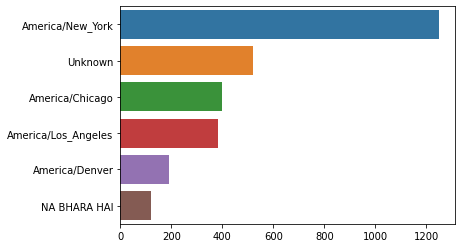

In [41]:
sns.barplot(y=subsetter.index,x=subsetter.to_numpy())

In [42]:
# The a field contains data about the browser,application used to perform the URL shortening

In [43]:
frames['a']

0       Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...
1                                  GoogleMaps/RochesterNY
2       Mozilla/4.0 (compatible; MSIE 8.0; Windows NT ...
3       Mozilla/5.0 (Macintosh; Intel Mac OS X 10_6_8)...
4       Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...
                              ...                        
3555    Mozilla/4.0 (compatible; MSIE 9.0; Windows NT ...
3556    Mozilla/5.0 (Windows NT 5.1) AppleWebKit/535.1...
3557                               GoogleMaps/RochesterNY
3558                                       GoogleProducer
3559    Mozilla/4.0 (compatible; MSIE 8.0; Windows NT ...
Name: a, Length: 3560, dtype: object

In [44]:
frames['a'][0]

'Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/535.11 (KHTML, like Gecko) Chrome/17.0.963.78 Safari/535.11'

In [45]:
recorder

[{'a': 'Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/535.11 (KHTML, like Gecko) Chrome/17.0.963.78 Safari/535.11',
  'c': 'US',
  'nk': 1,
  'tz': 'America/New_York',
  'gr': 'MA',
  'g': 'A6qOVH',
  'h': 'wfLQtf',
  'l': 'orofrog',
  'al': 'en-US,en;q=0.8',
  'hh': '1.usa.gov',
  'r': 'http://www.facebook.com/l/7AQEFzjSi/1.usa.gov/wfLQtf',
  'u': 'http://www.ncbi.nlm.nih.gov/pubmed/22415991',
  't': 1331923247,
  'hc': 1331822918,
  'cy': 'Danvers',
  'll': [42.576698, -70.954903]},
 {'a': 'GoogleMaps/RochesterNY',
  'c': 'US',
  'nk': 0,
  'tz': 'America/Denver',
  'gr': 'UT',
  'g': 'mwszkS',
  'h': 'mwszkS',
  'l': 'bitly',
  'hh': 'j.mp',
  'r': 'http://www.AwareMap.com/',
  'u': 'http://www.monroecounty.gov/etc/911/rss.php',
  't': 1331923249,
  'hc': 1308262393,
  'cy': 'Provo',
  'll': [40.218102, -111.613297]},
 {'a': 'Mozilla/4.0 (compatible; MSIE 8.0; Windows NT 6.1; WOW64; Trident/4.0; SLCC2; .NET CLR 2.0.50727; .NET CLR 3.5.30729; .NET CLR 3.0.30729; Media Center PC 6.0

In [46]:
# Now taking all the useful data from the 'a' field might seem a bit of a daunting task so what we can do is 
# just split of the first token from the string and make another summary of it

In [47]:
split_result = [ z.split()[0]  for z in frames['a'].dropna()]

split_result

['Mozilla/5.0',
 'GoogleMaps/RochesterNY',
 'Mozilla/4.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Opera/9.80',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'GoogleMaps/RochesterNY',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/4.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/4.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/4.0',
 'Mozilla/5.0',
 'Mozilla/4.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'BlackBerry8520/5.0.0.592',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/4.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/4.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/5.0',
 'Mozilla/4.0',
 'Mozilla/4.0',
 'Mozi

In [48]:
frames['a'].notna()

0       True
1       True
2       True
3       True
4       True
        ... 
3555    True
3556    True
3557    True
3558    True
3559    True
Name: a, Length: 3560, dtype: bool

In [49]:
# Now suppose you want to divide the timezones on basis of whether the person there is windows user or not

In [50]:
split_timezone = frames[frames['a'].notna()].copy()

split_timezone



,a,c,nk,tz,gr,g,h,l,al,hh,r,u,t,hc,cy,ll,_heartbeat_,kw
0,Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...,US,1.0,America/New_York,MA,A6qOVH,wfLQtf,orofrog,"en-US,en;q=0.8",1.usa.gov,http://www.facebook.com/l/7AQEFzjSi/1.usa.gov/...,http://www.ncbi.nlm.nih.gov/pubmed/22415991,1.331923e+09,1.331823e+09,Danvers,"[42.576698, -70.954903]",NaN,NaN
1,GoogleMaps/RochesterNY,US,0.0,America/Denver,UT,mwszkS,mwszkS,bitly,NaN,j.mp,http://www.AwareMap.com/,http://www.monroecounty.gov/etc/911/rss.php,1.331923e+09,1.308262e+09,Provo,"[40.218102, -111.613297]",NaN,NaN
2,Mozilla/4.0 (compatible; MSIE 8.0; Windows NT ...,US,1.0,America/New_York,DC,xxr3Qb,xxr3Qb,bitly,en-US,1.usa.gov,http://t.co/03elZC4Q,http://boxer.senate.gov/en/press/releases/0316...,1.331923e+09,1.331920e+09,Washington,"[38.9007, -77.043098]",NaN,NaN
3,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_6_8)...,BR,0.0,America/Sao_Paulo,27,zCaLwp,zUtuOu,alelex88,pt-br,1.usa.gov,direct,http://apod.nasa.gov/apod/ap120312.html,1.331923e+09,1.331923e+09,Braz,"[-23.549999, -46.616699]",NaN,NaN
4,Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...,US,0.0,America/New_York,MA,9b6kNl,9b6kNl,bitly,"en-US,en;q=0.8",bit.ly,http://www.shrewsbury-ma.gov/selco/,http://www.shrewsbury-ma.gov/egov/gallery/1341...,1.331923e+09,1.273672e+09,Shrewsbury,"[42.286499, -71.714699]",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3555,Mozilla/4.0 (compatible; MSIE 9.0; Windows NT ...,US,1.0,America/New_York,NJ,e5SvKE,fqPSr9,tweetdeckapi,en,1.usa.gov,direct,http://www.fda.gov/AdvisoryCommittees/Committe...,1.331927e+09,1.301298e+09,Paramus,"[40.9445, -74.07]",NaN,NaN
3556,Mozilla/5.0 (Windows NT 5.1) AppleWebKit/535.1...,US,0.0,America/Chicago,OK,jQLtP4,jQLtP4,bitly,"en-US,en;q=0.8",1.usa.gov,http://www.facebook.com/l.php?u=http%3A%2F%2F1...,http://www.okc.gov/PublicNotificationSystem/Fo...,1.331927e+09,1.307530e+09,Oklahoma City,"[35.4715, -97.518997]",NaN,NaN
3557,GoogleMaps/RochesterNY,US,0.0,America/Denver,UT,mwszkS,mwszkS,bitly,NaN,j.mp,http://www.AwareMap.com/,http://www.monroecounty.gov/etc/911/rss.php,1.331927e+09,1.308262e+09,Provo,"[40.218102, -111.613297]",NaN,NaN
3558,GoogleProducer,US,0.0,America/Los_Angeles,CA,zjtI4X,zjtI4X,bitly,NaN,1.usa.gov,direct,http://www.ahrq.gov/qual/qitoolkit/,1.331927e+09,1.327529e+09,Mountain View,"[37.419201, -122.057404]",NaN,NaN


In [51]:
# Finally let's divide the data

In [52]:
split_timezone['OS USED'] = np.where(split_timezone['a'].str.contains('Windows'),'Windows','Not Windows')

split_timezone['OS USED']

0           Windows
1       Not Windows
2           Windows
3       Not Windows
4           Windows
           ...     
3555        Windows
3556        Windows
3557    Not Windows
3558    Not Windows
3559        Windows
Name: OS USED, Length: 3440, dtype: object

In [53]:
# Now we will club the timezone data and the os columns

In [54]:
by_tz_os = split_timezone.groupby(['tz','OS USED'])

by_tz_os.mean()

nk             t            hc  \
tz                  OS USED                                             
Africa/Cairo        Windows      0.333333  1.331924e+09  1.304479e+09   
Africa/Casablanca   Windows      0.000000  1.331926e+09  1.328021e+09   
Africa/Ceuta        Windows      0.000000  1.331925e+09  1.331627e+09   
Africa/Johannesburg Windows      0.000000  1.331925e+09  1.331923e+09   
Africa/Lusaka       Windows      0.000000  1.331925e+09  1.327006e+09   
...                                   ...           ...           ...   
Pacific/Auckland    Not Windows  1.000000  1.331926e+09  1.331805e+09   
                    Windows      0.000000  1.331926e+09  1.331810e+09   
Pacific/Honolulu    Windows      0.833333  1.331924e+09  1.331393e+09   
Unknown             Not Windows  0.281633  1.331925e+09  1.325870e+09   
                    Windows      0.500000  1.331925e+09  1.324013e+09   

                                 _heartbeat_  
tz                  OS USED                   
Africa/Cairo        Windows              NaN  
Africa/Casablanca   Windows              NaN  
Africa/Ceuta        Windows              NaN  
Africa/Johannesburg Windows              NaN  
Africa/Lusaka       Windows              NaN  
...                                      ...  
Pacific/Auckland    Not Windows          NaN  
                    Windows              NaN  
Pacific/Honolulu    Windows              NaN  
Unknown             Not Windows          NaN  
                    Windows              NaN  

[149 rows x 4 columns]

In [55]:
# Now, let's convert the data into more presentable structure

In [56]:
agg_counts = by_tz_os.size().unstack().fillna(0)

agg_counts

OS USED,Not Windows,Windows
tz,,
Africa/Cairo,0.0,3.0
Africa/Casablanca,0.0,1.0
Africa/Ceuta,0.0,2.0
Africa/Johannesburg,0.0,1.0
Africa/Lusaka,0.0,1.0
...,...,...
Europe/Warsaw,1.0,15.0
Europe/Zurich,4.0,0.0
Pacific/Auckland,3.0,8.0


In [57]:
# Now we are in the final phase. Brace yourself cuz it's about to get hot

In [58]:
# First we will construct an indirect index array from the row counts in agg_counts using agg_counts.sum('columns'),
# Then we will use argsort() to obtain index array that can be used to sort in ascending order

In [59]:
indexer = agg_counts.sum('columns').argsort()

indexer

tz
Africa/Cairo           75
Africa/Casablanca      36
Africa/Ceuta           35
Africa/Johannesburg    54
Africa/Lusaka          33
                       ..
Europe/Warsaw          14
Europe/Zurich          21
Pacific/Auckland       11
Pacific/Honolulu       96
Unknown                28
Length: 97, dtype: int64

In [60]:
# Now we will use take to select rows in the order and then slice off after selecting the 10 largest values

In [61]:
count_subsets = agg_counts.take(indexer[-10:])

count_subsets

OS USED,Not Windows,Windows
tz,,
America/Sao_Paulo,13.0,20.0
Europe/Madrid,16.0,19.0
Pacific/Honolulu,0.0,36.0
Asia/Tokyo,2.0,35.0
Europe/London,43.0,31.0
America/Denver,132.0,59.0
America/Los_Angeles,130.0,252.0
America/Chicago,115.0,285.0
Unknown,245.0,276.0


In [62]:
count_subsets

OS USED,Not Windows,Windows
tz,,
America/Sao_Paulo,13.0,20.0
Europe/Madrid,16.0,19.0
Pacific/Honolulu,0.0,36.0
Asia/Tokyo,2.0,35.0
Europe/London,43.0,31.0
America/Denver,132.0,59.0
America/Los_Angeles,130.0,252.0
America/Chicago,115.0,285.0
Unknown,245.0,276.0


In [63]:
count_subsets = count_subsets.stack()

count_subsets

# Important tip, this block can only run once because once the value has been stacked it obviously cannot be stacked again

tz                   OS USED    
America/Sao_Paulo    Not Windows     13.0
                     Windows         20.0
Europe/Madrid        Not Windows     16.0
                     Windows         19.0
Pacific/Honolulu     Not Windows      0.0
                     Windows         36.0
Asia/Tokyo           Not Windows      2.0
                     Windows         35.0
Europe/London        Not Windows     43.0
                     Windows         31.0
America/Denver       Not Windows    132.0
                     Windows         59.0
America/Los_Angeles  Not Windows    130.0
                     Windows        252.0
America/Chicago      Not Windows    115.0
                     Windows        285.0
Unknown              Not Windows    245.0
                     Windows        276.0
America/New_York     Not Windows    339.0
                     Windows        912.0
dtype: float64

In [64]:
count_subsets.name = 'Poora'

count_subsets

tz                   OS USED    
America/Sao_Paulo    Not Windows     13.0
                     Windows         20.0
Europe/Madrid        Not Windows     16.0
                     Windows         19.0
Pacific/Honolulu     Not Windows      0.0
                     Windows         36.0
Asia/Tokyo           Not Windows      2.0
                     Windows         35.0
Europe/London        Not Windows     43.0
                     Windows         31.0
America/Denver       Not Windows    132.0
                     Windows         59.0
America/Los_Angeles  Not Windows    130.0
                     Windows        252.0
America/Chicago      Not Windows    115.0
                     Windows        285.0
Unknown              Not Windows    245.0
                     Windows        276.0
America/New_York     Not Windows    339.0
                     Windows        912.0
Name: Poora, dtype: float64

In [65]:
count_subsets = count_subsets.reset_index()

count_subsets

,tz,OS USED,Poora
0,America/Sao_Paulo,Not Windows,13.0
1,America/Sao_Paulo,Windows,20.0
2,Europe/Madrid,Not Windows,16.0
3,Europe/Madrid,Windows,19.0
4,Pacific/Honolulu,Not Windows,0.0
5,Pacific/Honolulu,Windows,36.0
6,Asia/Tokyo,Not Windows,2.0
7,Asia/Tokyo,Windows,35.0
8,Europe/London,Not Windows,43.0
9,Europe/London,Windows,31.0


<AxesSubplot:xlabel='Poora', ylabel='tz'>

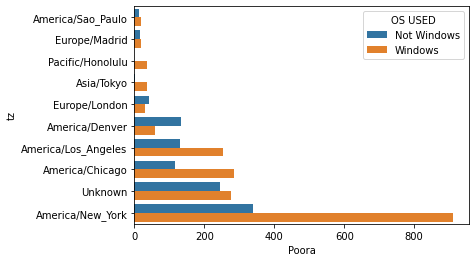

In [66]:
sns.barplot(x='Poora',y='tz',hue='OS USED',data=count_subsets)

In [67]:
# Now, to make the visibility of the relative percentages more clear we normalize the group percentages to sum to 1

In [68]:
def normie(grp):
    grp['normie_total'] = grp['Poora']/grp['Poora'].sum()
    
    return grp

In [69]:
final_result = count_subsets.groupby('tz').apply(normie)

final_result

,tz,OS USED,Poora,normie_total
0,America/Sao_Paulo,Not Windows,13.0,0.393939
1,America/Sao_Paulo,Windows,20.0,0.606061
2,Europe/Madrid,Not Windows,16.0,0.457143
3,Europe/Madrid,Windows,19.0,0.542857
4,Pacific/Honolulu,Not Windows,0.0,0.000000
5,Pacific/Honolulu,Windows,36.0,1.000000
6,Asia/Tokyo,Not Windows,2.0,0.054054
7,Asia/Tokyo,Windows,35.0,0.945946
8,Europe/London,Not Windows,43.0,0.581081
9,Europe/London,Windows,31.0,0.418919


<AxesSubplot:xlabel='normie_total', ylabel='tz'>

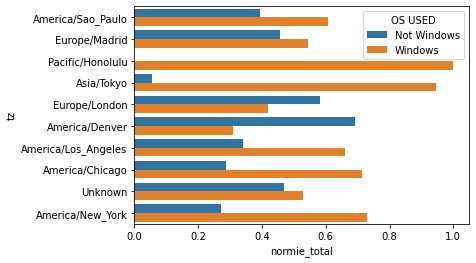

In [70]:
sns.barplot(x='normie_total',y='tz',hue='OS USED',data=final_result)

In [71]:
# The process of obtaining the normalized sum could have been done more efficiently by using transform method with groupby

In [72]:
g = count_subsets.groupby('tz')

g.median()

,Poora
tz,
America/Chicago,200.0
America/Denver,95.5
America/Los_Angeles,191.0
America/New_York,625.5
America/Sao_Paulo,16.5
Asia/Tokyo,18.5
Europe/London,37.0
Europe/Madrid,17.5
Pacific/Honolulu,18.0


In [73]:
final_result_efficent = count_subsets['Poora']/g['Poora'].transform('sum')

final_result_efficent

0     0.393939
1     0.606061
2     0.457143
3     0.542857
4     0.000000
5     1.000000
6     0.054054
7     0.945946
8     0.581081
9     0.418919
10    0.691099
11    0.308901
12    0.340314
13    0.659686
14    0.287500
15    0.712500
16    0.470250
17    0.529750
18    0.270983
19    0.729017
Name: Poora, dtype: float64

## MovieLens 1M Dataset

In [74]:
# The movielens dataset contains one million ratings collected from 6000+ reviewers on 4000 movies.
# It consists of three tables each of which can be loaded into DataFrame using the read table method

In [75]:
unames = ['user_id','gender','age','occupation','zip']
users = pd.read_table('datasets/movielens/users.dat',names=unames,
                      sep = '::',header=None,engine='python')

users

,user_id,gender,age,occupation,zip
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455
...,...,...,...,...,...
6035,6036,F,25,15,32603
6036,6037,F,45,1,76006
6037,6038,F,56,1,14706
6038,6039,F,45,0,01060


In [76]:
rnames = ['user_id','movie_id','movie_rating','timestamp']

ratings = pd.read_table('datasets/movielens/ratings.dat',names=rnames,
                        sep = '::',header=None,engine='python')

ratings

,user_id,movie_id,movie_rating,timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291
...,...,...,...,...
1000204,6040,1091,1,956716541
1000205,6040,1094,5,956704887
1000206,6040,562,5,956704746
1000207,6040,1096,4,956715648


In [77]:
mnames = ['movie_id','Title','genres']

movies = pd.read_table('datasets/movielens/movies.dat',names=mnames,
                       sep = '::',header=None,engine='python')

movies

,movie_id,Title,genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
3878,3948,Meet the Parents (2000),Comedy
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama


In [78]:
# Now suppose you wanted to compute the mean rating of movies based on age and genres, so it is much easier to do so with
# all the three tables combined

In [79]:
# We do the merging using pandas merge functions. We first join the user and ratings tables on the user_id column
# Then we merge this result with the movies table on the movie_id column

In [80]:
# pandas itself infers which columns to use for merge or join based on the overlapping names. 
# Important note. Merge happens only on the basis of names and not the columns, if the data is not matching then check.

In [81]:
dataa = pd.merge(pd.merge(ratings,users),movies)


dataa

,user_id,movie_id,movie_rating,timestamp,gender,age,occupation,zip,Title,genres
0,1,1193,5,978300760,F,1,10,48067,One Flew Over the Cuckoo's Nest (1975),Drama
1,2,1193,5,978298413,M,56,16,70072,One Flew Over the Cuckoo's Nest (1975),Drama
2,12,1193,4,978220179,M,25,12,32793,One Flew Over the Cuckoo's Nest (1975),Drama
3,15,1193,4,978199279,M,25,7,22903,One Flew Over the Cuckoo's Nest (1975),Drama
4,17,1193,5,978158471,M,50,1,95350,One Flew Over the Cuckoo's Nest (1975),Drama
...,...,...,...,...,...,...,...,...,...,...
1000204,5949,2198,5,958846401,M,18,17,47901,Modulations (1998),Documentary
1000205,5675,2703,3,976029116,M,35,14,30030,Broken Vessels (1998),Drama
1000206,5780,2845,1,958153068,M,18,17,92886,White Boys (1999),Drama
1000207,5851,3607,5,957756608,F,18,20,55410,One Little Indian (1973),Comedy|Drama|Western


In [82]:
# Now on to our earlier requirement of getting the rating of each film sorted by gender

In [83]:
mean_ratings = dataa.pivot_table('movie_rating',index='Title',
                                 columns='gender',aggfunc='mean')

mean_ratings

gender,F,M
Title,,
"$1,000,000 Duck (1971)",3.375000,2.761905
'Night Mother (1986),3.388889,3.352941
'Til There Was You (1997),2.675676,2.733333
"'burbs, The (1989)",2.793478,2.962085
...And Justice for All (1979),3.828571,3.689024
...,...,...
"Zed & Two Noughts, A (1985)",3.500000,3.380952
Zero Effect (1998),3.864407,3.723140
Zero Kelvin (Kjærlighetens kjøtere) (1995),NaN,3.500000


In [84]:
# Now let's find the movies that received atleast 250 ratings

In [85]:
highly_rated = dataa.groupby('Title').size()

highly_rated

Title
$1,000,000 Duck (1971)                         37
'Night Mother (1986)                           70
'Til There Was You (1997)                      52
'burbs, The (1989)                            303
...And Justice for All (1979)                 199
                                             ... 
Zed & Two Noughts, A (1985)                    29
Zero Effect (1998)                            301
Zero Kelvin (Kjærlighetens kjøtere) (1995)      2
Zeus and Roxanne (1997)                        23
eXistenZ (1999)                               410
Length: 3706, dtype: int64

In [86]:
active_titles = highly_rated.index[highly_rated >=250]

active_titles

Index([''burbs, The (1989)', '10 Things I Hate About You (1999)',
       '101 Dalmatians (1961)', '101 Dalmatians (1996)', '12 Angry Men (1957)',
       '13th Warrior, The (1999)', '2 Days in the Valley (1996)',
       '20,000 Leagues Under the Sea (1954)', '2001: A Space Odyssey (1968)',
       '2010 (1984)',
       ...
       'X-Men (2000)', 'Year of Living Dangerously (1982)',
       'Yellow Submarine (1968)', 'You've Got Mail (1998)',
       'Young Frankenstein (1974)', 'Young Guns (1988)',
       'Young Guns II (1990)', 'Young Sherlock Holmes (1985)',
       'Zero Effect (1998)', 'eXistenZ (1999)'],
      dtype='object', name='Title', length=1216)

In [87]:
# Now we have the top viewed movies as an index object. Now we can pass this to the mean_ratings and select rows using iloc

In [88]:
mean_ratings= mean_ratings.loc[active_titles]

mean_ratings

gender,F,M
Title,,
"'burbs, The (1989)",2.793478,2.962085
10 Things I Hate About You (1999),3.646552,3.311966
101 Dalmatians (1961),3.791444,3.500000
101 Dalmatians (1996),3.240000,2.911215
12 Angry Men (1957),4.184397,4.328421
...,...,...
Young Guns (1988),3.371795,3.425620
Young Guns II (1990),2.934783,2.904025
Young Sherlock Holmes (1985),3.514706,3.363344


In [89]:
# Now let's sort these movies on the basis of those that have been highly viewed by females

In [90]:
top_female_ratings = mean_ratings.sort_values('F',ascending=False)

top_female_ratings

gender,F,M
Title,,
"Close Shave, A (1995)",4.644444,4.473795
"Wrong Trousers, The (1993)",4.588235,4.478261
Sunset Blvd. (a.k.a. Sunset Boulevard) (1950),4.572650,4.464589
Wallace & Gromit: The Best of Aardman Animation (1996),4.563107,4.385075
Schindler's List (1993),4.562602,4.491415
...,...,...
"Avengers, The (1998)",1.915254,2.017467
Speed 2: Cruise Control (1997),1.906667,1.863014
Rocky V (1990),1.878788,2.132780


### Measuring Rating Disagreement

In [91]:
# Suppose you wanted to find movies that are most divisive between male and female audience. 
# One way to do that is by adding a mean_difference column

In [92]:
mean_ratings['diff'] = mean_ratings['F'] - mean_ratings['M']

mean_ratings

gender,F,M,diff
Title,,,
"'burbs, The (1989)",2.793478,2.962085,-0.168607
10 Things I Hate About You (1999),3.646552,3.311966,0.334586
101 Dalmatians (1961),3.791444,3.500000,0.291444
101 Dalmatians (1996),3.240000,2.911215,0.328785
12 Angry Men (1957),4.184397,4.328421,-0.144024
...,...,...,...
Young Guns (1988),3.371795,3.425620,-0.053825
Young Guns II (1990),2.934783,2.904025,0.030758
Young Sherlock Holmes (1985),3.514706,3.363344,0.151362


In [93]:
# Now let's do the sorting in a particular order to get the more insight

In [94]:
sorted_by_diff = mean_ratings.sort_values('diff')

sorted_by_diff

gender,F,M,diff
Title,,,
"Good, The Bad and The Ugly, The (1966)",3.494949,4.221300,-0.726351
"Kentucky Fried Movie, The (1977)",2.878788,3.555147,-0.676359
Dumb & Dumber (1994),2.697987,3.336595,-0.638608
"Longest Day, The (1962)",3.411765,4.031447,-0.619682
"Cable Guy, The (1996)",2.250000,2.863787,-0.613787
...,...,...,...
Steel Magnolias (1989),3.901734,3.365957,0.535777
Little Women (1994),3.870588,3.321739,0.548849
Grease (1978),3.975265,3.367041,0.608224


In [95]:
# Now let's reverse the order to see which movies were appreciated more by females but not much by males

In [96]:
sorted_by_diff[::-1]

gender,F,M,diff
Title,,,
Dirty Dancing (1987),3.790378,2.959596,0.830782
Jumpin' Jack Flash (1986),3.254717,2.578358,0.676359
Grease (1978),3.975265,3.367041,0.608224
Little Women (1994),3.870588,3.321739,0.548849
Steel Magnolias (1989),3.901734,3.365957,0.535777
...,...,...,...
"Cable Guy, The (1996)",2.250000,2.863787,-0.613787
"Longest Day, The (1962)",3.411765,4.031447,-0.619682
Dumb & Dumber (1994),2.697987,3.336595,-0.638608


In [97]:
active_titles

Index([''burbs, The (1989)', '10 Things I Hate About You (1999)',
       '101 Dalmatians (1961)', '101 Dalmatians (1996)', '12 Angry Men (1957)',
       '13th Warrior, The (1999)', '2 Days in the Valley (1996)',
       '20,000 Leagues Under the Sea (1954)', '2001: A Space Odyssey (1968)',
       '2010 (1984)',
       ...
       'X-Men (2000)', 'Year of Living Dangerously (1982)',
       'Yellow Submarine (1968)', 'You've Got Mail (1998)',
       'Young Frankenstein (1974)', 'Young Guns (1988)',
       'Young Guns II (1990)', 'Young Sherlock Holmes (1985)',
       'Zero Effect (1998)', 'eXistenZ (1999)'],
      dtype='object', name='Title', length=1216)

In [98]:
# Now suppose you wanted data on the basis of most disagreement but not based on gender. This type of disagreement 
# can be measured by Variance or standard deviation

In [99]:
# TO get this we first start with computing the rating standard deviation and then use the active_titles dataset that has
# the movies as index to get the result

In [100]:
dataa

,user_id,movie_id,movie_rating,timestamp,gender,age,occupation,zip,Title,genres
0,1,1193,5,978300760,F,1,10,48067,One Flew Over the Cuckoo's Nest (1975),Drama
1,2,1193,5,978298413,M,56,16,70072,One Flew Over the Cuckoo's Nest (1975),Drama
2,12,1193,4,978220179,M,25,12,32793,One Flew Over the Cuckoo's Nest (1975),Drama
3,15,1193,4,978199279,M,25,7,22903,One Flew Over the Cuckoo's Nest (1975),Drama
4,17,1193,5,978158471,M,50,1,95350,One Flew Over the Cuckoo's Nest (1975),Drama
...,...,...,...,...,...,...,...,...,...,...
1000204,5949,2198,5,958846401,M,18,17,47901,Modulations (1998),Documentary
1000205,5675,2703,3,976029116,M,35,14,30030,Broken Vessels (1998),Drama
1000206,5780,2845,1,958153068,M,18,17,92886,White Boys (1999),Drama
1000207,5851,3607,5,957756608,F,18,20,55410,One Little Indian (1973),Comedy|Drama|Western


In [101]:
rating_std_by_title = dataa['movie_rating'].groupby(dataa['Title']).std()

rating_std_by_title

Title
$1,000,000 Duck (1971)                        1.092563
'Night Mother (1986)                          1.118636
'Til There Was You (1997)                     1.020159
'burbs, The (1989)                            1.107760
...And Justice for All (1979)                 0.878110
                                                ...   
Zed & Two Noughts, A (1985)                   1.052794
Zero Effect (1998)                            1.042932
Zero Kelvin (Kjærlighetens kjøtere) (1995)    0.707107
Zeus and Roxanne (1997)                       1.122884
eXistenZ (1999)                               1.178568
Name: movie_rating, Length: 3706, dtype: float64

In [102]:
rating_std_by_title = rating_std_by_title.loc[active_titles]

rating_std_by_title

Title
'burbs, The (1989)                   1.107760
10 Things I Hate About You (1999)    0.989815
101 Dalmatians (1961)                0.982103
101 Dalmatians (1996)                1.098717
12 Angry Men (1957)                  0.812731
                                       ...   
Young Guns (1988)                    1.017437
Young Guns II (1990)                 1.071959
Young Sherlock Holmes (1985)         0.891176
Zero Effect (1998)                   1.042932
eXistenZ (1999)                      1.178568
Name: movie_rating, Length: 1216, dtype: float64

In [103]:
# Then we reverse the order to get the most divisive movies list

In [104]:
rating_std_by_title.sort_values(ascending=False)

Title
Dumb & Dumber (1994)                     1.321333
Blair Witch Project, The (1999)          1.316368
Natural Born Killers (1994)              1.307198
Tank Girl (1995)                         1.277695
Rocky Horror Picture Show, The (1975)    1.260177
                                           ...   
Wrong Trousers, The (1993)               0.708666
Shawshank Redemption, The (1994)         0.700443
Great Escape, The (1963)                 0.692585
Rear Window (1954)                       0.688946
Close Shave, A (1995)                    0.667143
Name: movie_rating, Length: 1216, dtype: float64

In [105]:
# Now let's focus on the movie genres. As seen in the dataset the movie genres are separated by pipe "|".
# So to help us group the rating data by genre, we will use the explode method on DataFrame.

In [106]:
# We first start with the split method and split the genres string into list of genres using the str.split()

In [107]:
movies

,movie_id,Title,genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
3878,3948,Meet the Parents (2000),Comedy
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama


In [108]:
movies['genres']

0        Animation|Children's|Comedy
1       Adventure|Children's|Fantasy
2                     Comedy|Romance
3                       Comedy|Drama
4                             Comedy
                    ...             
3878                          Comedy
3879                           Drama
3880                           Drama
3881                           Drama
3882                  Drama|Thriller
Name: genres, Length: 3883, dtype: object

In [109]:
movies['genres'].str.split('|')



0        [Animation, Children's, Comedy]
1       [Adventure, Children's, Fantasy]
2                      [Comedy, Romance]
3                        [Comedy, Drama]
4                               [Comedy]
                      ...               
3878                            [Comedy]
3879                             [Drama]
3880                             [Drama]
3881                             [Drama]
3882                   [Drama, Thriller]
Name: genres, Length: 3883, dtype: object

In [110]:

movies

,movie_id,Title,genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
3878,3948,Meet the Parents (2000),Comedy
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama


In [111]:
movies['genres'] = movies['genres'].str.split('|')

movies

,movie_id,Title,genres
0,1,Toy Story (1995),"[Animation, Children's, Comedy]"
1,2,Jumanji (1995),"[Adventure, Children's, Fantasy]"
2,3,Grumpier Old Men (1995),"[Comedy, Romance]"
3,4,Waiting to Exhale (1995),"[Comedy, Drama]"
4,5,Father of the Bride Part II (1995),[Comedy]
...,...,...,...
3878,3948,Meet the Parents (2000),[Comedy]
3879,3949,Requiem for a Dream (2000),[Drama]
3880,3950,Tigerland (2000),[Drama]
3881,3951,Two Family House (2000),[Drama]


In [112]:
# Now we will use the explode function.
# The explode function works in a way that for every element that it encounters in the genres columns' data list
# it will make a new row. ex:- [Comedy, Drama] will be split into two rows

In [113]:
explosive_movies = movies.explode('genres')

explosive_movies

,movie_id,Title,genres
0,1,Toy Story (1995),Animation
0,1,Toy Story (1995),Children's
0,1,Toy Story (1995),Comedy
1,2,Jumanji (1995),Adventure
1,2,Jumanji (1995),Children's
...,...,...,...
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama
3882,3952,"Contender, The (2000)",Drama


In [114]:
# Now let's merge all three tables together and group by genre

In [115]:
rating_with_genre = pd.merge(pd.merge(explosive_movies,ratings),users)

rating_with_genre

,movie_id,Title,genres,user_id,movie_rating,timestamp,gender,age,occupation,zip
0,1,Toy Story (1995),Animation,1,5,978824268,F,1,10,48067
1,1,Toy Story (1995),Children's,1,5,978824268,F,1,10,48067
2,1,Toy Story (1995),Comedy,1,5,978824268,F,1,10,48067
3,48,Pocahontas (1995),Animation,1,5,978824351,F,1,10,48067
4,48,Pocahontas (1995),Children's,1,5,978824351,F,1,10,48067
...,...,...,...,...,...,...,...,...,...,...
2101810,3536,Keeping the Faith (2000),Romance,5727,5,958489902,M,25,4,92843
2101811,3555,U-571 (2000),Action,5727,3,958490699,M,25,4,92843
2101812,3555,U-571 (2000),Thriller,5727,3,958490699,M,25,4,92843
2101813,3578,Gladiator (2000),Action,5727,5,958490171,M,25,4,92843


In [116]:
genre_rating = (rating_with_genre['movie_rating'].groupby([rating_with_genre['genres'],rating_with_genre['age']]).mean().unstack('age')
                )
genre_rating

age,1,18,25,35,45,50,56
genres,,,,,,,
Action,3.506385,3.447097,3.453358,3.538107,3.528543,3.611333,3.610709
Adventure,3.449975,3.408525,3.443163,3.515291,3.528963,3.628163,3.649064
Animation,3.476113,3.624014,3.701228,3.740545,3.734856,3.780020,3.756233
Children's,3.241642,3.294257,3.426873,3.518423,3.527593,3.556555,3.621822
Comedy,3.497491,3.460417,3.490385,3.561984,3.591789,3.646868,3.650949
Crime,3.710170,3.668054,3.680321,3.733736,3.750661,3.810688,3.832549
Documentary,3.730769,3.865865,3.946690,3.953747,3.966521,3.908108,3.961538
Drama,3.794735,3.721930,3.726428,3.782512,3.784356,3.878415,3.933465
Fantasy,3.317647,3.353778,3.452484,3.482301,3.532468,3.581570,3.532700


## U.S Baby Names 1880-2010

In [117]:
# Here we have many datasets in form of CSV files that have baby names for the  period mentioned above.
# In this section we will aim to analyse few of the mentioned points
# Visualize the proportion of babies given a particular name
# Determine the relative rank of a name
# Determine the most popular name each year or the names whose popularity has advanced or declined the most
# Analyze trends in names:vowels,consonants,biblical names, celebrities

In [118]:
#let's load the data

In [119]:
# The important part to see in this block is labelled as " @ Important", rest all is me just testing what has been 
# done in the following blocks

lis = []

names1880 = pd.read_csv('datasets/babynames/yob1880.txt',
                        names=['name','sex','births'])   # @ Important

names1880['year'] = 1880

lis.append(names1880)

names1881 = pd.read_csv('datasets/babynames/yob1881.txt',
                       names=['name','sex','births'])

names1881['year'] = 1881
lis.append(names1881)

# print(names1880)

# print(names1881)

print(names1880.count)

print(names1881.count)


print(type(names1881))

concatenated_names = pd.concat(lis)

concatenated_names

print(len(lis))

concatenated_names.count

<bound method DataFrame.count of            name sex  births  year
0          Mary   F    7065  1880
1          Anna   F    2604  1880
2          Emma   F    2003  1880
3     Elizabeth   F    1939  1880
4        Minnie   F    1746  1880
...         ...  ..     ...   ...
1995     Woodie   M       5  1880
1996     Worthy   M       5  1880
1997     Wright   M       5  1880
1998       York   M       5  1880
1999  Zachariah   M       5  1880

[2000 rows x 4 columns]>
<bound method DataFrame.count of            name sex  births  year
0          Mary   F    6919  1881
1          Anna   F    2698  1881
2          Emma   F    2034  1881
3     Elizabeth   F    1852  1881
4      Margaret   F    1658  1881
...         ...  ..     ...   ...
1930     Wiliam   M       5  1881
1931     Wilton   M       5  1881
1932       Wing   M       5  1881
1933       Wood   M       5  1881
1934     Wright   M       5  1881

[1935 rows x 4 columns]>
<class 'pandas.core.frame.DataFrame'>
2


<bound method DataFrame.count of            name sex  births  year
0          Mary   F    7065  1880
1          Anna   F    2604  1880
2          Emma   F    2003  1880
3     Elizabeth   F    1939  1880
4        Minnie   F    1746  1880
...         ...  ..     ...   ...
1930     Wiliam   M       5  1881
1931     Wilton   M       5  1881
1932       Wing   M       5  1881
1933       Wood   M       5  1881
1934     Wright   M       5  1881

[3935 rows x 4 columns]>

In [120]:
names1880['births'].groupby(names1880['sex']).sum()

sex
F     90993
M    110493
Name: births, dtype: int64

In [121]:
names1880['sex'].groupby(names1880['name']).describe().sort_values(ascending = False , by = 'count')
# Khudse kiya maine

,count,unique,top,freq
name,,,,
Grace,2,2,F,1
Emma,2,2,F,1
Clair,2,2,F,1
Florence,2,2,F,1
Clara,2,2,F,1
...,...,...,...,...
Evan,1,1,M,1
Evalyn,1,1,F,1
Evaline,1,1,F,1


In [122]:
# Now the problem here is that the data has been divided on the basis of year, so the first step to take is to 
# concatenate the data into one single dataframe

In [123]:
o.getcwd()

'C:\\Users\\manas\\PycharmProjects\\wes mckinney'

In [124]:
mylist = []

for year in range(1880,2011):
    filepath = f'datasets/babynames/yob{year}.txt'
    frame = pd.read_csv(filepath,names=['name','sex','births'])
    frame['year']  = year
    mylist.append(frame)

# concatenated_names_data = pd.concat(mylist)

# concatenated_names_data.count

# Now one thing here, if you concatenate concatenated_names_data = pd.concat(mylist) like this then the original index
# is preserved, but we are not interested in that, so we do it like this


concatenated_names_data = pd.concat(mylist,ignore_index=True)

concatenated_names_data

,name,sex,births,year
0,Mary,F,7065,1880
1,Anna,F,2604,1880
2,Emma,F,2003,1880
3,Elizabeth,F,1939,1880
4,Minnie,F,1746,1880
...,...,...,...,...
1690779,Zymaire,M,5,2010
1690780,Zyonne,M,5,2010
1690781,Zyquarius,M,5,2010
1690782,Zyran,M,5,2010


In [125]:
# Now with this data in hand we can start with the further data manipulation, first one being pivot

In [126]:
total_birth_df = concatenated_names_data.pivot_table(values='births',columns='sex',index = 'year',aggfunc='sum')

total_birth_df

sex,F,M
year,,
1880,90993,110493
1881,91955,100748
1882,107851,113687
1883,112322,104632
1884,129021,114445
...,...,...
2006,1896468,2050234
2007,1916888,2069242
2008,1883645,2032310


<AxesSubplot:title={'center':'Gender separation over the years'}, xlabel='year'>

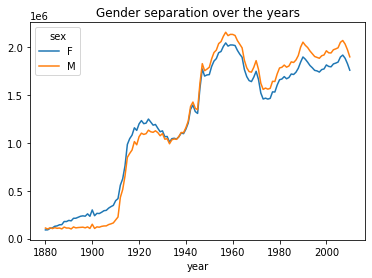

In [127]:
# Let's plot this now
total_birth_df.plot(title = 'Gender separation over the years')

In [128]:
#Now let's add a column prop, what this column represents are values that show the number of babies given a particular name.

# So a prop value of 0.02 indicates that suppose 100 babies were born in particular year and out of them 2 had same name



In [129]:
# So first we start of by grouping the data on basis of gender and year
concatenated_names_data.groupby(['year','sex']).describe()

births                                                        
            count        mean         std  min  25%   50%    75%      max
year sex                                                                 
1880 F      942.0   96.595541  328.149759  5.0  7.0  13.0  43.75   7065.0
     M     1058.0  104.435728  561.252276  5.0  7.0  12.0  41.00   9655.0
1881 F      938.0   98.033049  327.251251  5.0  7.0  13.5  44.00   6919.0
     M      997.0  101.051153  521.907855  5.0  7.0  13.0  40.00   8769.0
1882 F     1028.0  104.913424  366.769605  5.0  7.0  13.0  46.00   8149.0
...           ...         ...         ...  ...  ...   ...    ...      ...
2008 M    14590.0  139.294722  932.806822  5.0  7.0  11.0  29.00  22507.0
2009 F    20123.0   90.823585  553.430324  5.0  7.0  11.0  29.00  22222.0
     M    14479.0  136.291111  892.300472  5.0  7.0  11.0  30.00  21036.0
2010 F    19698.0   89.298914  541.848393  5.0  7.0  11.0  29.00  22731.0
     M    14140.0  134.256153  860.579330  5.0  7.0  11.0  30.00  21875.0

[262 rows x 8 columns]

In [130]:
# Now we calculate the sum of number of children born per year on basis of gender
concatenated_names_data.groupby(['year','sex']).sum()
#concatenated_names_data.groupby(['year','sex']).sum() just another groupby not related to our situation right now but useful

births
year sex         
1880 F      90993
     M     110493
1881 F      91955
     M     100748
1882 F     107851
...           ...
2008 M    2032310
2009 F    1827643
     M    1973359
2010 F    1759010
     M    1898382

[262 rows x 1 columns]

In [131]:
concatenated_names_data['births'].sum()

322402727

In [132]:
# now we write the logic for the prop

def add_prop(gro):
    print(gro,'gro hai \n')
    print(gro['births'],'gro births hai \n')
    gro['prop'] = gro['births']/gro['births'].sum()
    return gro


In [133]:
# Now we will modify the original DataFrame so that it only has the required groupby columns

names = concatenated_names_data.groupby([concatenated_names_data['year'],concatenated_names_data['sex']]).apply(add_prop)


names

          name sex  births  year
0         Mary   F    7065  1880
1         Anna   F    2604  1880
2         Emma   F    2003  1880
3    Elizabeth   F    1939  1880
4       Minnie   F    1746  1880
..         ...  ..     ...   ...
937        Ula   F       5  1880
938     Vannie   F       5  1880
939     Verona   F       5  1880
940     Vertie   F       5  1880
941      Wilma   F       5  1880

[942 rows x 4 columns] gro hai 

0      7065
1      2604
2      2003
3      1939
4      1746
       ... 
937       5
938       5
939       5
940       5
941       5
Name: births, Length: 942, dtype: int64 gro births hai 

           name sex  births  year
942        John   M    9655  1880
943     William   M    9533  1880
944       James   M    5927  1880
945     Charles   M    5348  1880
946      George   M    5126  1880
...         ...  ..     ...   ...
1995     Woodie   M       5  1880
1996     Worthy   M       5  1880
1997     Wright   M       5  1880
1998       York   M       5  1880
1999  Z

[1179 rows x 4 columns] gro hai 

32671    8049
32672    7223
32673    5028
32674    4320
32675    3723
         ... 
33845       5
33846       5
33847       5
33848       5
33849       5
Name: births, Length: 1179, dtype: int64 gro births hai 

            name sex  births  year
33850       Mary   F   13151  1894
33851       Anna   F    5565  1894
33852   Margaret   F    3701  1894
33853      Helen   F    3676  1894
33854  Elizabeth   F    3425  1894
...          ...  ..     ...   ...
35547     Vester   F       5  1894
35548  Victorine   F       5  1894
35549   Walburga   F       5  1894
35550   Willetta   F       5  1894
35551       Zura   F       5  1894

[1702 rows x 4 columns] gro hai 

33850    13151
33851     5565
33852     3701
33853     3676
33854     3425
         ...  
35547        5
35548        5
35549        5
35550        5
35551        5
Name: births, Length: 1702, dtype: int64 gro births hai 

          name sex  births  year
35552     John   M    8238  1894
35553  Wil

           name sex  births  year
108495     John   M   29318  1913
108496  William   M   23535  1913
108497    James   M   20828  1913
108498   Robert   M   15680  1913
108499   Joseph   M   14470  1913
...         ...  ..     ...   ...
111750   Yutaka   M       5  1913
111751     Zach   M       5  1913
111752   Zeddie   M       5  1913
111753    Zenas   M       5  1913
111754    Zenus   M       5  1913

[3260 rows x 4 columns] gro hai 

108495    29318
108496    23535
108497    20828
108498    15680
108499    14470
          ...  
111750        5
111751        5
111752        5
111753        5
111754        5
Name: births, Length: 3260, dtype: int64 gro births hai 

            name sex  births  year
111755      Mary   F   45341  1914
111756     Helen   F   23218  1914
111757   Dorothy   F   18779  1914
111758  Margaret   F   17756  1914
111759      Ruth   F   15835  1914
...          ...  ..     ...   ...
115954    Zephyr   F       5  1914
115955   Zilphia   F       5  1914
115956  

            name sex  births  year
357344      Mary   F   54903  1939
357345   Barbara   F   37262  1939
357346  Patricia   F   29699  1939
357347     Betty   F   23637  1939
357348   Shirley   F   20442  1939
...          ...  ..     ...   ...
362291     Zelia   F       5  1939
362292     Zepha   F       5  1939
362293   Zerlene   F       5  1939
362294   Zerline   F       5  1939
362295     Zoann   F       5  1939

[4952 rows x 4 columns] gro hai 

357344    54903
357345    37262
357346    29699
357347    23637
357348    20442
          ...  
362291        5
362292        5
362293        5
362294        5
362295        5
Name: births, Length: 4952, dtype: int64 gro births hai 

             name sex  births  year
362296     Robert   M   59623  1939
362297      James   M   59602  1939
362298       John   M   51024  1939
362299    William   M   42059  1939
362300    Richard   M   35364  1939
...           ...  ..     ...   ...
366259     Yoshio   M       5  1939
366260      Yukio   M  

             name sex  births  year
616315    Michael   M   83779  1963
616316       John   M   78639  1963
616317      David   M   78489  1963
616318      James   M   71318  1963
616319     Robert   M   70012  1963
...           ...  ..     ...   ...
620928        Wyn   M       5  1963
620929     Yaakov   M       5  1963
620930        Zac   M       5  1963
620931  Zachariah   M       5  1963
620932       Zora   M       5  1963

[4618 rows x 4 columns] gro hai 

616315    83779
616316    78639
616317    78489
616318    71318
616319    70012
          ...  
620928        5
620929        5
620930        5
620931        5
620932        5
Name: births, Length: 4618, dtype: int64 gro births hai 

            name sex  births  year
620933      Lisa   F   54271  1964
620934      Mary   F   40978  1964
620935     Susan   F   31511  1964
620936     Karen   F   30235  1964
620937  Patricia   F   26081  1964
...          ...  ..     ...   ...
628729    Yonnie   F       5  1964
628730   Yovonne   

981035    52643
981036    49672
981037    40513
981038    36172
981039    28122
          ...  
993841        5
993842        5
993843        5
993844        5
993845        5
Name: births, Length: 12811, dtype: int64 gro births hai 

                name sex  births  year
993846       Michael   M   64164  1986
993847   Christopher   M   56661  1986
993848       Matthew   M   46897  1986
993849        Joshua   M   37524  1986
993850         David   M   37114  1986
...              ...  ..     ...   ...
1001658          Zia   M       5  1986
1001659          Zoe   M       5  1986
1001660        Zoilo   M       5  1986
1001661       Zollie   M       5  1986
1001662       Zubair   M       5  1986

[7817 rows x 4 columns] gro hai 

993846     64164
993847     56661
993848     46897
993849     37524
993850     37114
           ...  
1001658        5
1001659        5
1001660        5
1001661        5
1001662        5
Name: births, Length: 7817, dtype: int64 gro births hai 

             name


1642467    21036
1642468    19783
1642469    18822
1642470    18175
1642471    17852
           ...  
1656941        5
1656942        5
1656943        5
1656944        5
1656945        5
Name: births, Length: 14479, dtype: int64 gro births hai 

              name sex  births  year
1656946   Isabella   F   22731  2010
1656947     Sophia   F   20477  2010
1656948       Emma   F   17179  2010
1656949     Olivia   F   16860  2010
1656950        Ava   F   15300  2010
...            ...  ..     ...   ...
1676639     Zylynn   F       5  2010
1676640     Zyniya   F       5  2010
1676641    Zyonnah   F       5  2010
1676642    Zyriana   F       5  2010
1676643  Zyrihanna   F       5  2010

[19698 rows x 4 columns] gro hai 

1656946    22731
1656947    20477
1656948    17179
1656949    16860
1656950    15300
           ...  
1676639        5
1676640        5
1676641        5
1676642        5
1676643        5
Name: births, Length: 19698, dtype: int64 gro births hai 

              name sex  bir

,name,sex,births,year,prop
0,Mary,F,7065,1880,0.077643
1,Anna,F,2604,1880,0.028618
2,Emma,F,2003,1880,0.022013
3,Elizabeth,F,1939,1880,0.021309
4,Minnie,F,1746,1880,0.019188
...,...,...,...,...,...
1690779,Zymaire,M,5,2010,0.000003
1690780,Zyonne,M,5,2010,0.000003
1690781,Zyquarius,M,5,2010,0.000003
1690782,Zyran,M,5,2010,0.000003


In [134]:
names

,name,sex,births,year,prop
0,Mary,F,7065,1880,0.077643
1,Anna,F,2604,1880,0.028618
2,Emma,F,2003,1880,0.022013
3,Elizabeth,F,1939,1880,0.021309
4,Minnie,F,1746,1880,0.019188
...,...,...,...,...,...
1690779,Zymaire,M,5,2010,0.000003
1690780,Zyonne,M,5,2010,0.000003
1690781,Zyquarius,M,5,2010,0.000003
1690782,Zyran,M,5,2010,0.000003


In [135]:
# Now, when performing such high level of group operations it is often advised to do a little sanity check

In [136]:
names.groupby(['year','sex'])['prop'].sum()

year  sex
1880  F      1.0
      M      1.0
1881  F      1.0
      M      1.0
1882  F      1.0
            ... 
2008  M      1.0
2009  F      1.0
      M      1.0
2010  F      1.0
      M      1.0
Name: prop, Length: 262, dtype: float64

In [137]:
# Now let's limit the data to top 1000 names on basis of gender and per year

In [138]:
names

,name,sex,births,year,prop
0,Mary,F,7065,1880,0.077643
1,Anna,F,2604,1880,0.028618
2,Emma,F,2003,1880,0.022013
3,Elizabeth,F,1939,1880,0.021309
4,Minnie,F,1746,1880,0.019188
...,...,...,...,...,...
1690779,Zymaire,M,5,2010,0.000003
1690780,Zyonne,M,5,2010,0.000003
1690781,Zyquarius,M,5,2010,0.000003
1690782,Zyran,M,5,2010,0.000003


In [139]:
# Just check which name has the highest frequency

names.sort_values('births',ascending=False)

,name,sex,births,year,prop
431022,Linda,F,99651,1947,0.056229
441381,Linda,F,96185,1948,0.056657
437125,James,M,94601,1947,0.051768
544528,Michael,M,92700,1957,0.043008
437126,Robert,M,91557,1947,0.050102
...,...,...,...,...,...
1318448,Ceandra,F,5,1999,0.000003
1318447,Caysie,F,5,1999,0.000003
1318446,Cati,F,5,1999,0.000003
1318445,Cathryne,F,5,1999,0.000003


In [140]:
def top_1000(grp):
    print(grp,'grp hai')
    print(grp.sort_values('births',ascending = False)[:1000],' ye apna sorted hi')
    return grp.sort_values('births',ascending = False)[:1000]

In [141]:
grouped = names.groupby([names['year'],names['sex']])

grouped

In [142]:
top_1000 = grouped.apply(top_1000)

top_1000


          name sex  births  year      prop
0         Mary   F    7065  1880  0.077643
1         Anna   F    2604  1880  0.028618
2         Emma   F    2003  1880  0.022013
3    Elizabeth   F    1939  1880  0.021309
4       Minnie   F    1746  1880  0.019188
..         ...  ..     ...   ...       ...
937        Ula   F       5  1880  0.000055
938     Vannie   F       5  1880  0.000055
939     Verona   F       5  1880  0.000055
940     Vertie   F       5  1880  0.000055
941      Wilma   F       5  1880  0.000055

[942 rows x 5 columns] grp hai
          name sex  births  year      prop
0         Mary   F    7065  1880  0.077643
1         Anna   F    2604  1880  0.028618
2         Emma   F    2003  1880  0.022013
3    Elizabeth   F    1939  1880  0.021309
4       Minnie   F    1746  1880  0.019188
..         ...  ..     ...   ...       ...
866   Georgina   F       5  1880  0.000055
865      Genie   F       5  1880  0.000055
863      Etter   F       5  1880  0.000055
862      Estie   F    

           name sex  births  year      prop
39840      Mary   F   13811  1896  0.058048
39841      Anna   F    5860  1896  0.024630
39842     Helen   F    4392  1896  0.018460
39843  Margaret   F    4051  1896  0.017026
39844      Ruth   F    3905  1896  0.016413
...         ...  ..     ...   ...       ...
40805     Corda   F      12  1896  0.000050
40804  Clifford   F      12  1896  0.000050
40803  Carlotta   F      12  1896  0.000050
40874    Sarrah   F      11  1896  0.000046
40864     Lotus   F      11  1896  0.000046

[1000 rows x 5 columns]  ye apna sorted hi
          name sex  births  year      prop
41665     John   M    8139  1896  0.068066
41666  William   M    7747  1896  0.064788
41667    James   M    5207  1896  0.043546
41668   George   M    4286  1896  0.035844
41669  Charles   M    3640  1896  0.030441
...        ...  ..     ...   ...       ...
42926   Worley   M       5  1896  0.000042
42927   Wright   M       5  1896  0.000042
42928   Xavier   M       5  1896  0.00004

[1584 rows x 5 columns] grp hai
            name sex  births  year      prop
83135       John   M    9342  1908  0.060529
83136    William   M    7527  1908  0.048769
83137      James   M    7011  1908  0.045426
83138     George   M    4584  1908  0.029701
83139     Robert   M    4220  1908  0.027342
...          ...  ..     ...   ...       ...
84084  Arlington   M       9  1908  0.000058
84083      Angel   M       9  1908  0.000058
84082      Alpha   M       9  1908  0.000058
84081      Almer   M       9  1908  0.000058
84080        Alf   M       9  1908  0.000058

[1000 rows x 5 columns]  ye apna sorted hi
           name sex  births  year      prop
84719      Mary   F   19256  1909  0.055462
84720     Helen   F    9249  1909  0.026640
84721  Margaret   F    7358  1909  0.021193
84722      Ruth   F    6508  1909  0.018745
84723   Dorothy   F    6252  1909  0.018007
...         ...  ..     ...   ...       ...
87262   Yolande   F       5  1909  0.000014
87263    Zillah   F       5  190

              name sex  births  year      prop
191073        Mary   F   72156  1922  0.060090
191074     Dorothy   F   37711  1922  0.031405
191075       Helen   F   32501  1922  0.027066
191076    Margaret   F   26858  1922  0.022367
191077        Ruth   F   23622  1922  0.019672
...            ...  ..     ...   ...       ...
192062     Charity   F      57  1922  0.000047
192061  Antionette   F      57  1922  0.000047
192071       Coral   F      56  1922  0.000047
192072      Donald   F      56  1922  0.000047
192073      Goldia   F      56  1922  0.000047

[1000 rows x 5 columns]  ye apna sorted hi
             name sex  births  year      prop
196860       John   M   57276  1922  0.052625
196861     Robert   M   53810  1922  0.049440
196862    William   M   51136  1922  0.046984
196863      James   M   49803  1922  0.045759
196864    Charles   M   28855  1922  0.026512
...           ...  ..     ...   ...       ...
201827  Yoshiyuki   M       5  1922  0.000005
201828      Zenas   M   

[1000 rows x 5 columns]  ye apna sorted hi
           name sex  births  year      prop
317249   Robert   M   55811  1934  0.054082
317250    James   M   54230  1934  0.052550
317251     John   M   46716  1934  0.045269
317252  William   M   40146  1934  0.038903
317253  Richard   M   33142  1934  0.032116
...         ...  ..     ...   ...       ...
321450      Zan   M       5  1934  0.000005
321451   Zeddie   M       5  1934  0.000005
321452    Zenon   M       5  1934  0.000005
321453  Zigmund   M       5  1934  0.000005
321454  Zygmunt   M       5  1934  0.000005

[4206 rows x 5 columns] grp hai
           name sex  births  year      prop
317249   Robert   M   55811  1934  0.054082
317250    James   M   54230  1934  0.052550
317251     John   M   46716  1934  0.045269
317252  William   M   40146  1934  0.038903
317253  Richard   M   33142  1934  0.032116
...         ...  ..     ...   ...       ...
318229  Addison   M      42  1934  0.000041
318231   Ardell   M      42  1934  0.000041


            name sex  births  year      prop
431022     Linda   F   99651  1947  0.056229
431023      Mary   F   71654  1947  0.040431
431024  Patricia   F   51269  1947  0.028929
431025   Barbara   F   48778  1947  0.027523
431026    Sandra   F   34755  1947  0.019611
...          ...  ..     ...   ...       ...
432021      Mimi   F      79  1947  0.000045
432020   Marilou   F      79  1947  0.000045
432018   Gaynell   F      79  1947  0.000045
432017     Elvia   F      79  1947  0.000045
432016  Drucilla   F      79  1947  0.000045

[1000 rows x 5 columns]  ye apna sorted hi
            name sex  births  year      prop
437125     James   M   94601  1947  0.051768
437126    Robert   M   91557  1947  0.050102
437127      John   M   88251  1947  0.048293
437128   William   M   66917  1947  0.036618
437129   Richard   M   58445  1947  0.031982
...          ...  ..     ...   ...       ...
441376  Zacarias   M       5  1947  0.000003
441377       Zan   M       5  1947  0.000003
441378    Z

           name sex  births  year      prop
567796  Michael   M   85277  1959  0.039977
567797    David   M   83901  1959  0.039332
567798    James   M   78581  1959  0.036838
567799     John   M   76418  1959  0.035824
567800   Robert   M   74492  1959  0.034921
...         ...  ..     ...   ...       ...
572364   Ysabel   M       5  1959  0.000002
572365   Zalman   M       5  1959  0.000002
572366   Zebbie   M       5  1959  0.000002
572367  Zebulon   M       5  1959  0.000002
572368  Zyndall   M       5  1959  0.000002

[4573 rows x 5 columns] grp hai
            name sex  births  year      prop
567796   Michael   M   85277  1959  0.039977
567797     David   M   83901  1959  0.039332
567798     James   M   78581  1959  0.036838
567799      John   M   76418  1959  0.035824
567800    Robert   M   74492  1959  0.034921
...          ...  ..     ...   ...       ...
568791  Charlton   M      60  1959  0.000028
568792      Ezra   M      60  1959  0.000028
568793      King   M      60  1959

[1000 rows x 5 columns]  ye apna sorted hi
            name sex  births  year      prop
741938  Jennifer   F   62447  1973  0.042833
741939       Amy   F   26962  1973  0.018494
741940  Michelle   F   26927  1973  0.018470
741941  Kimberly   F   23530  1973  0.016140
741942      Lisa   F   22660  1973  0.015543
...          ...  ..     ...   ...       ...
751733   Zenovia   F       5  1973  0.000003
751734    Zipora   F       5  1973  0.000003
751735    Zorica   F       5  1973  0.000003
751736  Zubaidah   F       5  1973  0.000003
751737    Zuwena   F       5  1973  0.000003

[9800 rows x 5 columns] grp hai
            name sex  births  year      prop
741938  Jennifer   F   62447  1973  0.042833
741939       Amy   F   26962  1973  0.018494
741940  Michelle   F   26927  1973  0.018470
741941  Kimberly   F   23530  1973  0.016140
741942      Lisa   F   22660  1973  0.015543
...          ...  ..     ...   ...       ...
742933      Kyra   F     119  1973  0.000082
742934       Pam   F    

             name sex  births  year      prop
941476   Jennifer   F   50546  1984  0.030044
941477    Jessica   F   45841  1984  0.027247
941478     Ashley   F   38757  1984  0.023037
941479     Amanda   F   33893  1984  0.020146
941480      Sarah   F   25860  1984  0.015371
...           ...  ..     ...   ...       ...
942461     Bertha   F     146  1984  0.000087
942463  Dannielle   F     146  1984  0.000087
942462      Caryn   F     146  1984  0.000087
942474        Ava   F     145  1984  0.000086
942475    Rosalyn   F     145  1984  0.000086

[1000 rows x 5 columns]  ye apna sorted hi
               name sex  births  year      prop
953640      Michael   M   67686  1984  0.037546
953641  Christopher   M   59981  1984  0.033272
953642      Matthew   M   49741  1984  0.027592
953643       Joshua   M   40236  1984  0.022319
953644        David   M   38451  1984  0.021329
...             ...  ..     ...   ...       ...
960958         Zayd   M       5  1984  0.000003
960959      Zebedee 

                name sex  births  year      prop
1212048      Michael   M   41396  1995  0.021763
1212049      Matthew   M   32870  1995  0.017281
1212050  Christopher   M   32662  1995  0.017172
1212051        Jacob   M   31106  1995  0.016354
1212052       Joshua   M   30711  1995  0.016146
...              ...  ..     ...   ...       ...
1222364        Zerek   M       5  1995  0.000003
1222365         Zhen   M       5  1995  0.000003
1222366        Ziggy   M       5  1995  0.000003
1222367       Zuberi   M       5  1995  0.000003
1222368         Zyon   M       5  1995  0.000003

[10321 rows x 5 columns] grp hai
                name sex  births  year      prop
1212048      Michael   M   41396  1995  0.021763
1212049      Matthew   M   32870  1995  0.017281
1212050  Christopher   M   32662  1995  0.017172
1212051        Jacob   M   31106  1995  0.016354
1212052       Joshua   M   30711  1995  0.016146
...              ...  ..     ...   ...       ...
1213041     Damarcus   M     125  1

             name sex  births  year      prop
1552455     Emily   F   19322  2007  0.010080
1552456  Isabella   F   19105  2007  0.009967
1552457      Emma   F   18338  2007  0.009567
1552458       Ava   F   18031  2007  0.009406
1552459   Madison   F   17918  2007  0.009347
...           ...  ..     ...   ...       ...
1572970   Zykeira   F       5  2007  0.000003
1572971     Zymia   F       5  2007  0.000003
1572972    Zymira   F       5  2007  0.000003
1572973   Zyniyah   F       5  2007  0.000003
1572974     Zyree   F       5  2007  0.000003

[20520 rows x 5 columns] grp hai
             name sex  births  year      prop
1552455     Emily   F   19322  2007  0.010080
1552456  Isabella   F   19105  2007  0.009967
1552457      Emma   F   18338  2007  0.009567
1552458       Ava   F   18031  2007  0.009406
1552459   Madison   F   17918  2007  0.009347
...           ...  ..     ...   ...       ...
1553452  Hadassah   F     267  2007  0.000139
1553450    Carrie   F     267  2007  0.000139


name sex  births  year      prop
year sex                                               
1880 F   0             Mary   F    7065  1880  0.077643
         1             Anna   F    2604  1880  0.028618
         2             Emma   F    2003  1880  0.022013
         3        Elizabeth   F    1939  1880  0.021309
         4           Minnie   F    1746  1880  0.019188
...                     ...  ..     ...   ...       ...
2010 M   1677639     Camilo   M     194  2010  0.000102
         1677640     Destin   M     194  2010  0.000102
         1677641     Jaquan   M     194  2010  0.000102
         1677642     Jaydan   M     194  2010  0.000102
         1677645     Maxton   M     193  2010  0.000102

[261877 rows x 5 columns]

In [143]:
top_1000

name sex  births  year      prop
year sex                                               
1880 F   0             Mary   F    7065  1880  0.077643
         1             Anna   F    2604  1880  0.028618
         2             Emma   F    2003  1880  0.022013
         3        Elizabeth   F    1939  1880  0.021309
         4           Minnie   F    1746  1880  0.019188
...                     ...  ..     ...   ...       ...
2010 M   1677639     Camilo   M     194  2010  0.000102
         1677640     Destin   M     194  2010  0.000102
         1677641     Jaquan   M     194  2010  0.000102
         1677642     Jaydan   M     194  2010  0.000102
         1677645     Maxton   M     193  2010  0.000102

[261877 rows x 5 columns]

In [144]:
# Now here the index is not that useful hence we drop it

In [145]:
top_1000 = top_1000.reset_index(drop= True)

top_1000

,name,sex,births,year,prop
0,Mary,F,7065,1880,0.077643
1,Anna,F,2604,1880,0.028618
2,Emma,F,2003,1880,0.022013
3,Elizabeth,F,1939,1880,0.021309
4,Minnie,F,1746,1880,0.019188
...,...,...,...,...,...
261872,Camilo,M,194,2010,0.000102
261873,Destin,M,194,2010,0.000102
261874,Jaquan,M,194,2010,0.000102
261875,Jaydan,M,194,2010,0.000102


### Analyzing Naming Trends

In [146]:
# With the entire dataset in one hand and the top one thousand in another, we are ready to roll.

In [147]:
# we start off with analyzing various naming trends, and first we split the top one thousand on basis of gender

In [148]:
bois = top_1000[top_1000['sex'] == 'M']

bois

,name,sex,births,year,prop
942,John,M,9655,1880,0.087381
943,William,M,9533,1880,0.086277
944,James,M,5927,1880,0.053641
945,Charles,M,5348,1880,0.048401
946,George,M,5126,1880,0.046392
...,...,...,...,...,...
261872,Camilo,M,194,2010,0.000102
261873,Destin,M,194,2010,0.000102
261874,Jaquan,M,194,2010,0.000102
261875,Jaydan,M,194,2010,0.000102


In [149]:
gals = top_1000[top_1000['sex'] == 'F']

gals

,name,sex,births,year,prop
0,Mary,F,7065,1880,0.077643
1,Anna,F,2604,1880,0.028618
2,Emma,F,2003,1880,0.022013
3,Elizabeth,F,1939,1880,0.021309
4,Minnie,F,1746,1880,0.019188
...,...,...,...,...,...
260872,Violeta,F,250,2010,0.000142
260873,Leilah,F,250,2010,0.000142
260874,Alaysia,F,250,2010,0.000142
260875,Dania,F,249,2010,0.000142


In [150]:
# Now, let's form a pivot table of the total number of births by year and name

In [151]:
total_birth_year = top_1000.pivot_table(values='births',index='year',
                                       columns='name',aggfunc='sum')

total_birth_year

name,Aaden,Aaliyah,Aarav,Aaron,Aarush,Ab,Abagail,Abb,Abbey,Abbie,...,Zoa,Zoe,Zoey,Zoie,Zola,Zollie,Zona,Zora,Zula,Zuri
year,,,,,,,,,,,,,,,,,,,,,
1880,NaN,NaN,NaN,102.0,NaN,NaN,NaN,NaN,NaN,71.0,...,8.0,23.0,NaN,NaN,7.0,NaN,8.0,28.0,27.0,NaN
1881,NaN,NaN,NaN,94.0,NaN,NaN,NaN,NaN,NaN,81.0,...,NaN,22.0,NaN,NaN,10.0,NaN,9.0,21.0,27.0,NaN
1882,NaN,NaN,NaN,85.0,NaN,NaN,NaN,NaN,NaN,80.0,...,8.0,25.0,NaN,NaN,9.0,NaN,17.0,32.0,21.0,NaN
1883,NaN,NaN,NaN,105.0,NaN,NaN,NaN,NaN,NaN,79.0,...,NaN,23.0,NaN,NaN,10.0,NaN,11.0,35.0,25.0,NaN
1884,NaN,NaN,NaN,97.0,NaN,NaN,NaN,NaN,NaN,98.0,...,13.0,31.0,NaN,NaN,14.0,6.0,8.0,58.0,27.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006,NaN,3737.0,NaN,8279.0,NaN,NaN,297.0,NaN,404.0,440.0,...,NaN,5145.0,2839.0,530.0,NaN,NaN,NaN,NaN,NaN,NaN
2007,NaN,3941.0,NaN,8914.0,NaN,NaN,313.0,NaN,349.0,468.0,...,NaN,4925.0,3028.0,526.0,NaN,NaN,NaN,NaN,NaN,NaN
2008,955.0,4028.0,219.0,8511.0,NaN,NaN,317.0,NaN,344.0,400.0,...,NaN,4764.0,3438.0,492.0,NaN,NaN,NaN,NaN,NaN,NaN


In [152]:
total_birth_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 131 entries, 1880 to 2010
Columns: 6868 entries, Aaden to Zuri
dtypes: float64(6868)
memory usage: 6.9 MB


In [153]:
# Now we can do a check and plot few names from the DataFrame

In [154]:
total_birth_year_subset = total_birth_year[['Abagail','Zoe','John','Harry']]

array([<AxesSubplot:xlabel='year'>, <AxesSubplot:xlabel='year'>,
       <AxesSubplot:xlabel='year'>, <AxesSubplot:xlabel='year'>],
      dtype=object)

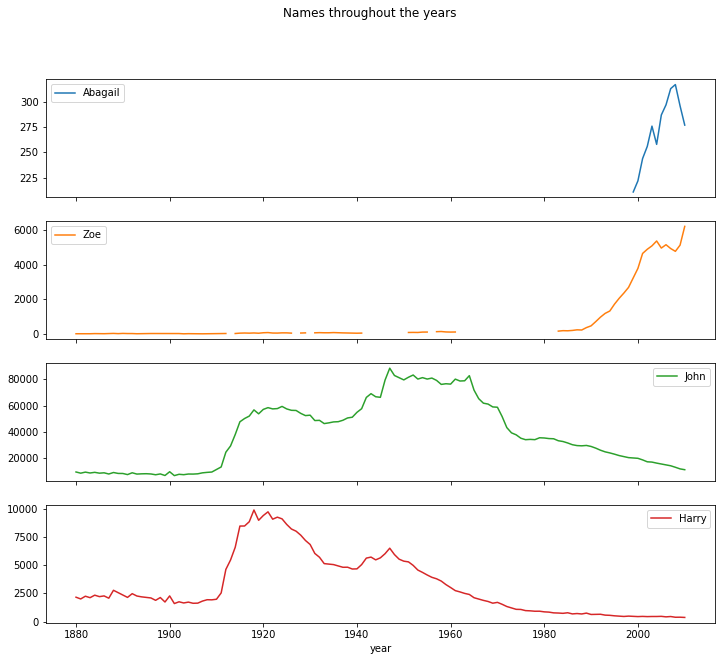

In [155]:
total_birth_year_subset.plot(subplots = True,figsize = (12,10),
                                title = 'Names throughout the years')

#### Measuring the increase in naming diversity

In [156]:
# Now as you can see above that names like John and Harry have dropped in popularity whereas Zoe and Abbagail have become
# more popular. This is because fewer parents are choosing common names for their children. This can be explained and
# confirmed by the data, we start off by measuring the propotion of births in the top 1000 most popular names, which
# we will aggregate and and plot by year and sex

In [157]:
table_name_trend = top_1000.pivot_table(values='prop',index='year',
                                        columns='sex',aggfunc='sum')

<AxesSubplot:title={'center':"'Sum of top1000's prop column on basis of year and sex"}, xlabel='year'>

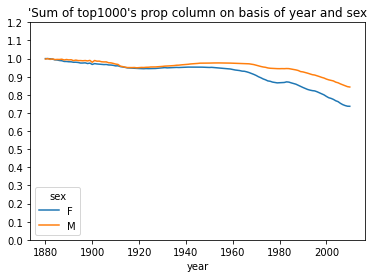

In [158]:
table_name_trend.plot(title = "'Sum of top1000's prop column on basis of year and sex",
                     yticks = np.linspace(0,1.2,13))

In [159]:
# As you can see that there is diversity that is being observed in the naming towards the year 2000 as lines separate

In [160]:
# Another way to check is to get the distinct names per year though it is much trickier to compute. 
# Let's just start with the boy's names from the year 2010

In [161]:
boys_df = bois[bois['year'] == 2010]

In [162]:
bois

,name,sex,births,year,prop
942,John,M,9655,1880,0.087381
943,William,M,9533,1880,0.086277
944,James,M,5927,1880,0.053641
945,Charles,M,5348,1880,0.048401
946,George,M,5126,1880,0.046392
...,...,...,...,...,...
261872,Camilo,M,194,2010,0.000102
261873,Destin,M,194,2010,0.000102
261874,Jaquan,M,194,2010,0.000102
261875,Jaydan,M,194,2010,0.000102


In [163]:
boys_df

,name,sex,births,year,prop
260877,Jacob,M,21875,2010,0.011523
260878,Ethan,M,17866,2010,0.009411
260879,Michael,M,17133,2010,0.009025
260880,Jayden,M,17030,2010,0.008971
260881,William,M,16870,2010,0.008887
...,...,...,...,...,...
261872,Camilo,M,194,2010,0.000102
261873,Destin,M,194,2010,0.000102
261874,Jaquan,M,194,2010,0.000102
261875,Jaydan,M,194,2010,0.000102


In [164]:
# Now we will sort prop in descending order and then see how many of the most popular names it takes to be in the top 50%

In [165]:
# One way to do this is by writing a for loop, however, another method using vectorized numpy alongwith cumsum and
# searchsorted is much more computationaly efficient

In [166]:
prop_cumsum = boys_df['prop'].sort_values(ascending=False).cumsum()

prop_cumsum

260877    0.011523
260878    0.020934
260879    0.029959
260880    0.038930
260881    0.047817
            ...   
261872    0.842748
261873    0.842850
261874    0.842953
261875    0.843055
261876    0.843156
Name: prop, Length: 1000, dtype: float64

In [167]:
prop_cumsum.searchsorted(0.5)

116

In [168]:
# Since arrays are zero indexed adding 1 to the result will gives you the final index number  
# Now what we can see from this number is that to be in the top 50% you need to beat 117 names
# however if we check the same in year 1900, the number will be less


In [169]:
boys_df = bois[bois['year'] == 1900]

boys_df

,name,sex,births,year,prop
40877,John,M,9834,1900,0.065319
40878,William,M,8580,1900,0.056990
40879,James,M,7246,1900,0.048129
40880,George,M,5405,1900,0.035901
40881,Charles,M,4102,1900,0.027246
...,...,...,...,...,...
41872,Theron,M,8,1900,0.000053
41873,Terrell,M,8,1900,0.000053
41874,Solon,M,8,1900,0.000053
41875,Rayfield,M,8,1900,0.000053


In [170]:
in900 = boys_df['prop'].sort_values(ascending=False).cumsum()
in900

40877    0.065319
40878    0.122308
40879    0.170437
40880    0.206338
40881    0.233584
           ...   
41848    0.979489
41847    0.979542
41846    0.979595
41845    0.979648
41876    0.979702
Name: prop, Length: 1000, dtype: float64

In [171]:
in900.searchsorted(0.5)

24

In [172]:
# see as we saw that in 1900 to be in the top 50% you need to be just above 25 more names

In [173]:
# Now with this done let's groupby these values on basis of year and sex

In [174]:
def get_quantile_grp(grp, q = 0.5):
    grp = grp.sort_values('prop',ascending = False)
    return grp.prop.cumsum().searchsorted(q) + 1

In [175]:
diversity = top_1000.groupby(['year','sex']).apply(get_quantile_grp)

diversity.unstack()

sex,F,M
year,,
1880,38,14
1881,38,14
1882,38,15
1883,39,15
1884,39,16
...,...,...
2006,209,99
2007,223,103
2008,234,109


In [176]:
top_1000

,name,sex,births,year,prop
0,Mary,F,7065,1880,0.077643
1,Anna,F,2604,1880,0.028618
2,Emma,F,2003,1880,0.022013
3,Elizabeth,F,1939,1880,0.021309
4,Minnie,F,1746,1880,0.019188
...,...,...,...,...,...
261872,Camilo,M,194,2010,0.000102
261873,Destin,M,194,2010,0.000102
261874,Jaquan,M,194,2010,0.000102
261875,Jaydan,M,194,2010,0.000102


In [177]:
# Now let's plot this

<AxesSubplot:title={'center':'top 50 percent babies'}, xlabel='year,sex'>

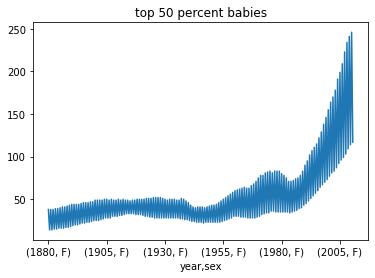

In [178]:
diversity.plot(title = 'top 50 percent babies')

#### The "last letter" Revolution

In [179]:
# A research has proved that last letters of baby names have changed over the last 100 years

In [180]:
def last(gro):
    return gro[-1]

In [181]:
last_letter = names['name'].map(last)

last_letter

0          y
1          a
2          a
3          h
4          e
          ..
1690779    e
1690780    e
1690781    s
1690782    n
1690783    x
Name: name, Length: 1690784, dtype: object

In [182]:
names

,name,sex,births,year,prop
0,Mary,F,7065,1880,0.077643
1,Anna,F,2604,1880,0.028618
2,Emma,F,2003,1880,0.022013
3,Elizabeth,F,1939,1880,0.021309
4,Minnie,F,1746,1880,0.019188
...,...,...,...,...,...
1690779,Zymaire,M,5,2010,0.000003
1690780,Zyonne,M,5,2010,0.000003
1690781,Zyquarius,M,5,2010,0.000003
1690782,Zyran,M,5,2010,0.000003


In [183]:
last_letter.name = 'Last Letter'

last_letter

0          y
1          a
2          a
3          h
4          e
          ..
1690779    e
1690780    e
1690781    s
1690782    n
1690783    x
Name: Last Letter, Length: 1690784, dtype: object

In [184]:
# Let's use these letter in a table with other dataset

In [185]:
table = names.pivot_table(values='births',columns=['sex','year'],
                          index = last_letter,aggfunc='sum')

table

sex                F                                                        \
year            1880     1881     1882     1883     1884     1885     1886   
Last Letter                                                                  
a            31446.0  31581.0  36536.0  38330.0  43680.0  45408.0  49100.0   
b                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
c                NaN      NaN      5.0      5.0      NaN      NaN      NaN   
d              609.0    607.0    734.0    810.0    916.0    862.0   1007.0   
e            33378.0  34080.0  40399.0  41914.0  48089.0  49616.0  53884.0   
f                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
g                7.0      5.0     12.0      8.0     24.0     11.0     18.0   
h             4863.0   4784.0   5567.0   5701.0   6602.0   6624.0   7146.0   
i               61.0     78.0     81.0     76.0     84.0     92.0     85.0   
j                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
k               13.0     15.0     11.0     17.0     21.0     18.0     27.0   
l             2541.0   2911.0   3527.0   3848.0   4808.0   5144.0   5721.0   
m               58.0     57.0     81.0     86.0     79.0     75.0    103.0   
n             3008.0   2959.0   3576.0   3837.0   4507.0   4735.0   5242.0   
o               30.0     49.0     35.0     47.0     74.0     84.0     93.0   
p                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
q                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
r              481.0    417.0    590.0    640.0    718.0    799.0    917.0   
s             1391.0   1316.0   1637.0   1794.0   2039.0   2127.0   2524.0   
t             2152.0   2165.0   2399.0   2554.0   2825.0   2889.0   3017.0   
u              380.0    427.0    410.0    444.0    490.0    495.0    511.0   
v                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
w                NaN      5.0      NaN      NaN      NaN      NaN      5.0   
x                NaN      NaN      NaN      7.0      NaN      NaN      NaN   
y            10469.0  10404.0  12145.0  12063.0  13917.0  13927.0  14936.0   
z              106.0     95.0    106.0    141.0    148.0    150.0    202.0   

sex                                     ...         M                      \
year            1887     1888     1889  ...      2001      2002      2003   
Last Letter                             ...                                 
a            48942.0  59442.0  58631.0  ...   39124.0   38815.0   37825.0   
b                NaN      NaN      NaN  ...   50950.0   49284.0   48065.0   
c                NaN      NaN      NaN  ...   27113.0   27238.0   27697.0   
d             1027.0   1298.0   1374.0  ...   60838.0   55829.0   53391.0   
e            54353.0  66750.0  66663.0  ...  145395.0  144651.0  144769.0   
f                NaN      NaN      NaN  ...    1758.0    1817.0    1819.0   
g               25.0     44.0     28.0  ...    2151.0    2084.0    2009.0   
h             7141.0   8630.0   8826.0  ...   85959.0   88085.0   88226.0   
i              105.0    141.0    134.0  ...   20980.0   23610.0   26011.0   
j                NaN      NaN      NaN  ...    1069.0    1088.0    1203.0   
k               19.0     21.0     22.0  ...   42477.0   42043.0   42296.0   
l             6175.0   7900.0   8395.0  ...  153648.0  153493.0  153862.0   
m               90.0    123.0    137.0  ...   41967.0   42663.0   42790.0   
n             5512.0   6833.0   7103.0  ...  616099.0  630322.0  663419.0   
o               97.0    134.0    142.0  ...   82146.0   83180.0   85423.0   
p                NaN      NaN      NaN  ...    3419.0    3157.0    2982.0   
q                NaN      NaN      NaN  ...     602.0     618.0     585.0   
r              910.0   1207.0   1214.0  ...  165377.0  164821.0  169878.0   
s             2803.0   3582.0   3569.0  ...  143791.0  139595.0  138632.0   
t             3140.0   3816.0   3784.0  ...

In [186]:
# Now let's select 3 years that are equally distanced over the 100 year course

In [187]:
subtable = table.reindex(columns=[1900,1960,2010],level='year')

subtable

sex                 F                            M                    
year             1900      1960      2010     1900      1960      2010
Last Letter                                                           
a             89934.0  691247.0  670605.0    870.0    5204.0   28438.0
b                 NaN     694.0     450.0    372.0    3912.0   38859.0
c                 NaN      49.0     946.0    299.0   15476.0   23125.0
d              3670.0    3729.0    2607.0  15499.0  262112.0   44398.0
e            107080.0  435013.0  313833.0  22731.0  178823.0  129012.0
f                 NaN      20.0      97.0    116.0    9224.0    2255.0
g                33.0     318.0     657.0    253.0   20235.0    2666.0
h             15303.0   73247.0  133424.0   6234.0   80841.0   98090.0
i               360.0   80812.0   55820.0    155.0    1286.0   42956.0
j                 NaN       NaN     159.0      NaN       NaN    1459.0
k                30.0     315.0     626.0   6074.0  105315.0   35198.0
l             14654.0   68482.0   46360.0   9317.0  223716.0  133583.0
m               307.0   17417.0    4552.0  10805.0   72139.0   46808.0
n             18269.0  264258.0  246631.0  20723.0  325266.0  688677.0
o               348.0    4932.0    2187.0   1770.0   27358.0   81025.0
p                 NaN      47.0      35.0    432.0   12102.0    2409.0
q                 NaN       NaN      53.0      NaN       NaN     342.0
r              3625.0   13677.0   31707.0  10288.0   66183.0  166064.0
s              9453.0   25810.0   23451.0  20059.0  219080.0  123670.0
t              6965.0   30738.0   13773.0  10265.0  140015.0   43398.0
u               350.0    1161.0     734.0     27.0     122.0    2318.0
v                 NaN     122.0     205.0     19.0      78.0    2723.0
w                 6.0      63.0    2080.0    949.0   16444.0   30656.0
x                 NaN      74.0    1279.0    528.0    3947.0   16352.0
y             28876.0  308504.0  205501.0  12746.0  343318.0  110425.0
z               610.0    1333.0    1238.0     23.0     392.0    3476.0

In [188]:
# Let's normalize the table by total births to compute a new table containing proportion of total births gender wise

In [189]:
subtable.sum()

sex  year
F    1900     299873.0
     1960    2022062.0
     2010    1759010.0
M    1900     150554.0
     1960    2132588.0
     2010    1898382.0
dtype: float64

In [190]:
llprop = subtable/ subtable.sum()

llprop

sex                 F                             M                    
year             1900      1960      2010      1900      1960      2010
Last Letter                                                            
a            0.299907  0.341853  0.381240  0.005779  0.002440  0.014980
b                 NaN  0.000343  0.000256  0.002471  0.001834  0.020470
c                 NaN  0.000024  0.000538  0.001986  0.007257  0.012181
d            0.012239  0.001844  0.001482  0.102946  0.122908  0.023387
e            0.357084  0.215133  0.178415  0.150982  0.083853  0.067959
f                 NaN  0.000010  0.000055  0.000770  0.004325  0.001188
g            0.000110  0.000157  0.000374  0.001680  0.009488  0.001404
h            0.051032  0.036224  0.075852  0.041407  0.037907  0.051670
i            0.001201  0.039965  0.031734  0.001030  0.000603  0.022628
j                 NaN       NaN  0.000090       NaN       NaN  0.000769
k            0.000100  0.000156  0.000356  0.040344  0.049384  0.018541
l            0.048867  0.033867  0.026356  0.061885  0.104904  0.070367
m            0.001024  0.008613  0.002588  0.071768  0.033827  0.024657
n            0.060922  0.130687  0.140210  0.137645  0.152522  0.362771
o            0.001160  0.002439  0.001243  0.011757  0.012829  0.042681
p                 NaN  0.000023  0.000020  0.002869  0.005675  0.001269
q                 NaN       NaN  0.000030       NaN       NaN  0.000180
r            0.012088  0.006764  0.018025  0.068334  0.031034  0.087477
s            0.031523  0.012764  0.013332  0.133235  0.102730  0.065145
t            0.023226  0.015201  0.007830  0.068182  0.065655  0.022861
u            0.001167  0.000574  0.000417  0.000179  0.000057  0.001221
v                 NaN  0.000060  0.000117  0.000126  0.000037  0.001434
w            0.000020  0.000031  0.001182  0.006303  0.007711  0.016148
x                 NaN  0.000037  0.000727  0.003507  0.001851  0.008614
y            0.096294  0.152569  0.116828  0.084661  0.160987  0.058168
z            0.002034  0.000659  0.000704  0.000153  0.000184  0.001831

In [191]:
# With letter propotions now in hand let's make the bar plots

<AxesSubplot:title={'center':'MAHILA'}, xlabel='Last Letter'>

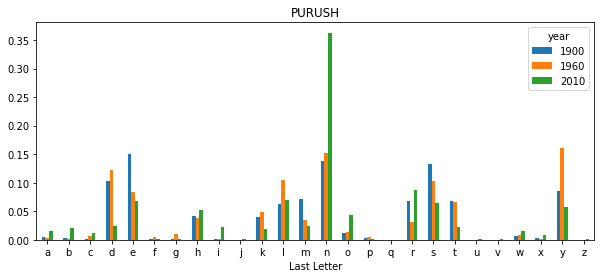

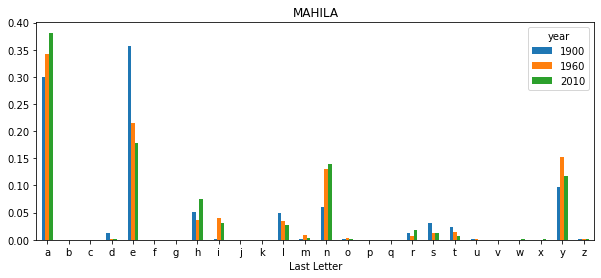

In [192]:
#fig,ax = plt.subplots(2,1,figsize = (10,8))

llprop['M'].plot.bar(title = 'PURUSH', rot = 0, figsize = (10,4))

llprop['F'].plot.bar(title = 'MAHILA', rot = 0, figsize = (10,4))

In [193]:
# As you can see for boys names ending with n have gained popularity

In [194]:
# Let's go back to the original table and normalize it by year and sex and transpose to make each column a time series

In [195]:
llprop = table/table.sum()

In [196]:

llprop

sex                 F                                                    \
year             1880      1881      1882      1883      1884      1885   
Last Letter                                                               
a            0.345587  0.343440  0.338764  0.341251  0.338550  0.341270   
b                 NaN       NaN       NaN       NaN       NaN       NaN   
c                 NaN       NaN  0.000046  0.000045       NaN       NaN   
d            0.006693  0.006601  0.006806  0.007211  0.007100  0.006478   
e            0.366819  0.370616  0.374582  0.373159  0.372722  0.372896   
f                 NaN       NaN       NaN       NaN       NaN       NaN   
g            0.000077  0.000054  0.000111  0.000071  0.000186  0.000083   
h            0.053444  0.052025  0.051618  0.050756  0.051170  0.049784   
i            0.000670  0.000848  0.000751  0.000677  0.000651  0.000691   
j                 NaN       NaN       NaN       NaN       NaN       NaN   
k            0.000143  0.000163  0.000102  0.000151  0.000163  0.000135   
l            0.027925  0.031657  0.032703  0.034259  0.037265  0.038660   
m            0.000637  0.000620  0.000751  0.000766  0.000612  0.000564   
n            0.033057  0.032179  0.033157  0.034161  0.034932  0.035587   
o            0.000330  0.000533  0.000325  0.000418  0.000574  0.000631   
p                 NaN       NaN       NaN       NaN       NaN       NaN   
q                 NaN       NaN       NaN       NaN       NaN       NaN   
r            0.005286  0.004535  0.005471  0.005698  0.005565  0.006005   
s            0.015287  0.014311  0.015178  0.015972  0.015804  0.015986   
t            0.023650  0.023544  0.022244  0.022738  0.021896  0.021713   
u            0.004176  0.004644  0.003802  0.003953  0.003798  0.003720   
v                 NaN       NaN       NaN       NaN       NaN       NaN   
w                 NaN  0.000054       NaN       NaN       NaN       NaN   
x                 NaN       NaN       NaN  0.000062       NaN       NaN   
y            0.115053  0.113142  0.112609  0.107397  0.107866  0.104670   
z            0.001165  0.001033  0.000983  0.001255  0.001147  0.001127   

sex                                                  ...         M            \
year             1886      1887      1888      1889  ...      2001      2002   
Last Letter                                          ...                       
a            0.339703  0.335258  0.332764  0.328706  ...  0.020162  0.020019   
b                 NaN       NaN       NaN       NaN  ...  0.026256  0.025418   
c                 NaN       NaN       NaN       NaN  ...  0.013972  0.014048   
d            0.006967  0.007035  0.007266  0.007703  ...  0.031352  0.028794   
e            0.372802  0.372324  0.373675  0.373736  ...  0.074927  0.074603   
f                 NaN       NaN       NaN       NaN  ...  0.000906  0.000937   
g            0.000125  0.000171  0.000246  0.000157  ...  0.001108  0.001075   
h            0.049440  0.048917  0.048312  0.049482  ...  0.044297  0.045429   
i            0.000588  0.000719  0.000789  0.000751  ...  0.010812  0.012177   
j                 NaN       NaN       NaN       NaN  ...  0.000551  0.000561   
k            0.000187  0.000130  0.000118  0.000123  ...  0.021890  0.021683   
l            0.039581  0.042299  0.044225  0.047065  ...  0.079180  0.079163   
m            0.000713  0.000617  0.000689  0.000768  ...  0.021627  0.022003   
n            0.036267  0.037758  0.038252  0.039822  ...  0.317495  0.325086   
o            0.000643  0.000664  0.000750  0.000796  ...  0.042332  0.042900   
p                 NaN       NaN       NaN       NaN  ...  0.001762  0.001628   
q                 NaN       NaN       NaN       NaN  ...  0.000310  0.000319   
r            0.006344  0.006234  0.006757  0.006806  ...  0.085224  0.085006   
s            0.017463  0.019201  0.020053  0.020009  ...  0.074100  0.071995   
t            0.020873  0.021509  0.021362  0.021214  ...  0.0245

In [197]:
table

sex                F                                                        \
year            1880     1881     1882     1883     1884     1885     1886   
Last Letter                                                                  
a            31446.0  31581.0  36536.0  38330.0  43680.0  45408.0  49100.0   
b                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
c                NaN      NaN      5.0      5.0      NaN      NaN      NaN   
d              609.0    607.0    734.0    810.0    916.0    862.0   1007.0   
e            33378.0  34080.0  40399.0  41914.0  48089.0  49616.0  53884.0   
f                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
g                7.0      5.0     12.0      8.0     24.0     11.0     18.0   
h             4863.0   4784.0   5567.0   5701.0   6602.0   6624.0   7146.0   
i               61.0     78.0     81.0     76.0     84.0     92.0     85.0   
j                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
k               13.0     15.0     11.0     17.0     21.0     18.0     27.0   
l             2541.0   2911.0   3527.0   3848.0   4808.0   5144.0   5721.0   
m               58.0     57.0     81.0     86.0     79.0     75.0    103.0   
n             3008.0   2959.0   3576.0   3837.0   4507.0   4735.0   5242.0   
o               30.0     49.0     35.0     47.0     74.0     84.0     93.0   
p                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
q                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
r              481.0    417.0    590.0    640.0    718.0    799.0    917.0   
s             1391.0   1316.0   1637.0   1794.0   2039.0   2127.0   2524.0   
t             2152.0   2165.0   2399.0   2554.0   2825.0   2889.0   3017.0   
u              380.0    427.0    410.0    444.0    490.0    495.0    511.0   
v                NaN      NaN      NaN      NaN      NaN      NaN      NaN   
w                NaN      5.0      NaN      NaN      NaN      NaN      5.0   
x                NaN      NaN      NaN      7.0      NaN      NaN      NaN   
y            10469.0  10404.0  12145.0  12063.0  13917.0  13927.0  14936.0   
z              106.0     95.0    106.0    141.0    148.0    150.0    202.0   

sex                                     ...         M                      \
year            1887     1888     1889  ...      2001      2002      2003   
Last Letter                             ...                                 
a            48942.0  59442.0  58631.0  ...   39124.0   38815.0   37825.0   
b                NaN      NaN      NaN  ...   50950.0   49284.0   48065.0   
c                NaN      NaN      NaN  ...   27113.0   27238.0   27697.0   
d             1027.0   1298.0   1374.0  ...   60838.0   55829.0   53391.0   
e            54353.0  66750.0  66663.0  ...  145395.0  144651.0  144769.0   
f                NaN      NaN      NaN  ...    1758.0    1817.0    1819.0   
g               25.0     44.0     28.0  ...    2151.0    2084.0    2009.0   
h             7141.0   8630.0   8826.0  ...   85959.0   88085.0   88226.0   
i              105.0    141.0    134.0  ...   20980.0   23610.0   26011.0   
j                NaN      NaN      NaN  ...    1069.0    1088.0    1203.0   
k               19.0     21.0     22.0  ...   42477.0   42043.0   42296.0   
l             6175.0   7900.0   8395.0  ...  153648.0  153493.0  153862.0   
m               90.0    123.0    137.0  ...   41967.0   42663.0   42790.0   
n             5512.0   6833.0   7103.0  ...  616099.0  630322.0  663419.0   
o               97.0    134.0    142.0  ...   82146.0   83180.0   85423.0   
p                NaN      NaN      NaN  ...    3419.0    3157.0    2982.0   
q                NaN      NaN      NaN  ...     602.0     618.0     585.0   
r              910.0   1207.0   1214.0  ...  165377.0  164821.0  169878.0   
s             2803.0   3582.0   3569.0  ...  143791.0  139595.0  138632.0   
t             3140.0   3816.0   3784.0  ...

In [198]:
last_letter_dny = llprop.loc[['d','n','y'],'M']

last_letter_dny

year,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,...,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010
Last Letter,,,,,,,,,,,,,,,,,,,,,
d,0.083055,0.083247,0.085340,0.084066,0.086120,0.085472,0.087647,0.089072,0.087707,0.091934,...,0.031352,0.028794,0.027069,0.026118,0.025420,0.025075,0.024451,0.023574,0.023398,0.023387
n,0.153213,0.153214,0.149560,0.151646,0.149915,0.146361,0.149659,0.148838,0.151286,0.151976,...,0.317495,0.325086,0.336344,0.341151,0.344319,0.351666,0.358274,0.361101,0.362523,0.362771
y,0.075760,0.077451,0.077537,0.079144,0.080405,0.081882,0.081681,0.082870,0.084919,0.086328,...,0.071687,0.069397,0.066197,0.064781,0.062806,0.060338,0.059634,0.060342,0.057223,0.058168


In [199]:
last_letter_dny_transposed = last_letter_dny.T

last_letter_dny_transposed

Last Letter,d,n,y
year,,,
1880,0.083055,0.153213,0.075760
1881,0.083247,0.153214,0.077451
1882,0.085340,0.149560,0.077537
1883,0.084066,0.151646,0.079144
1884,0.086120,0.149915,0.080405
...,...,...,...
2006,0.025075,0.351666,0.060338
2007,0.024451,0.358274,0.059634
2008,0.023574,0.361101,0.060342


<AxesSubplot:xlabel='year'>

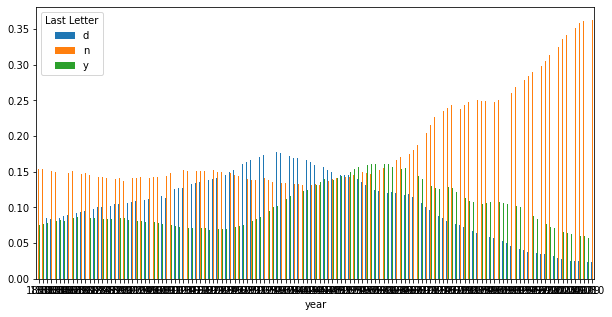

In [200]:
last_letter_dny_transposed.plot.bar(rot = 0 , figsize = (10,5))

<AxesSubplot:xlabel='year'>

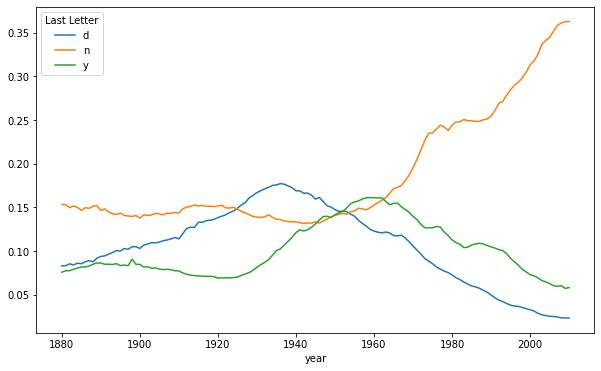

In [201]:
last_letter_dny_transposed.plot(figsize = (10,6))

In [202]:
last_letter_dny

year,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,...,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010
Last Letter,,,,,,,,,,,,,,,,,,,,,
d,0.083055,0.083247,0.085340,0.084066,0.086120,0.085472,0.087647,0.089072,0.087707,0.091934,...,0.031352,0.028794,0.027069,0.026118,0.025420,0.025075,0.024451,0.023574,0.023398,0.023387
n,0.153213,0.153214,0.149560,0.151646,0.149915,0.146361,0.149659,0.148838,0.151286,0.151976,...,0.317495,0.325086,0.336344,0.341151,0.344319,0.351666,0.358274,0.361101,0.362523,0.362771
y,0.075760,0.077451,0.077537,0.079144,0.080405,0.081882,0.081681,0.082870,0.084919,0.086328,...,0.071687,0.069397,0.066197,0.064781,0.062806,0.060338,0.059634,0.060342,0.057223,0.058168


<AxesSubplot:xlabel='Last Letter'>

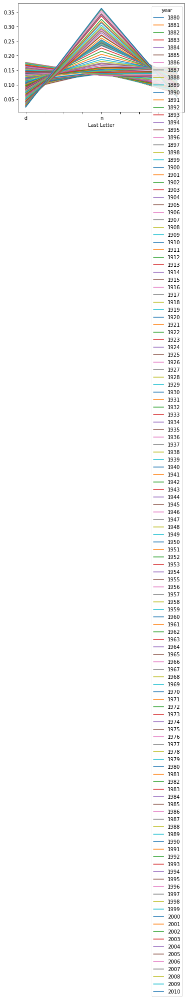

In [203]:
last_letter_dny.plot()

#### Boy names that became girl names (and vice versa)

In [204]:
# Let's try to find this trend that happened where names once popular with one gender became popular with another

In [205]:
top_1000

,name,sex,births,year,prop
0,Mary,F,7065,1880,0.077643
1,Anna,F,2604,1880,0.028618
2,Emma,F,2003,1880,0.022013
3,Elizabeth,F,1939,1880,0.021309
4,Minnie,F,1746,1880,0.019188
...,...,...,...,...,...
261872,Camilo,M,194,2010,0.000102
261873,Destin,M,194,2010,0.000102
261874,Jaquan,M,194,2010,0.000102
261875,Jaydan,M,194,2010,0.000102


In [206]:
all_names = top_1000['name']

all_names

0              Mary
1              Anna
2              Emma
3         Elizabeth
4            Minnie
            ...    
261872       Camilo
261873       Destin
261874       Jaquan
261875       Jaydan
261876       Maxton
Name: name, Length: 261877, dtype: object

In [207]:
name_like_lesley = all_names[all_names.str.contains('Lesl')]

name_like_lesley

632       Leslie
1108      Leslie
2462      Leslie
3014      Leslie
4512      Leslie
           ...  
256327     Lesly
258036    Leslie
258378     Lesly
260073    Leslie
260456     Lesly
Name: name, Length: 400, dtype: object

In [208]:
filtered_leslie = top_1000[top_1000['name'].isin(name_like_lesley)]

filtered_leslie

,name,sex,births,year,prop
632,Leslie,F,8,1880,0.000088
1108,Leslie,M,79,1880,0.000715
2462,Leslie,F,11,1881,0.000120
3014,Leslie,M,92,1881,0.000913
4512,Leslie,F,9,1882,0.000083
...,...,...,...,...,...
256327,Lesly,F,699,2008,0.000371
258036,Leslie,F,1975,2009,0.001081
258378,Lesly,F,598,2009,0.000327
260073,Leslie,F,1558,2010,0.000886


In [209]:
# Now, let's group by the name Leslie with the sum of the births

In [210]:
filtered_leslie['births'].groupby(filtered_leslie['name']).sum()

name
Leslee      1082
Lesley     35022
Lesli        929
Leslie    370429
Lesly      10067
Name: births, dtype: int64

In [211]:
# Now we will aggregate by sex and year then normalize within year

In [212]:
tabled_leslie = filtered_leslie.pivot_table(values='births',index = 'year',
                                            columns='sex',aggfunc='sum')
temp = filtered_leslie.pivot_table(values='births',index = 'year',
                                            columns='sex',aggfunc='sum')

tabled_leslie = tabled_leslie.div(tabled_leslie.sum(axis='columns'),axis='index') # This is another way of normalization
# it is same as tabled_leslie = tabled_leslie[column]/tabled_leslie[column].sum()

tabled_leslie

sex,F,M
year,,
1880,0.091954,0.908046
1881,0.106796,0.893204
1882,0.065693,0.934307
1883,0.053030,0.946970
1884,0.107143,0.892857
...,...,...
2006,1.000000,NaN
2007,1.000000,NaN
2008,1.000000,NaN


In [213]:
# Now let's plot and see

<AxesSubplot:xlabel='year'>

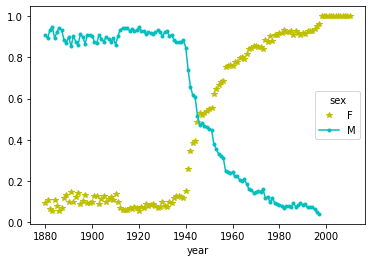

In [214]:
tabled_leslie.plot(style = {'M':'c.-','F':'y*'})

<AxesSubplot:xlabel='year'>

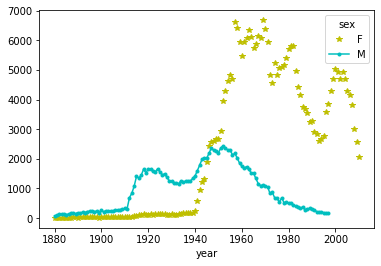

In [215]:
temp.plot(style = {'M':'c.-','F':'y*'})

## USDA Food Database

In [216]:
# This data is present in json format and it has two lists of portions and nutrient size

In [217]:
# First let's load the json file

In [218]:
db_food = jayz.load(open('datasets/usda_food/database.json'))

db_food

[{'id': 1008,
  'description': 'Cheese, caraway',
  'tags': [],
  'manufacturer': '',
  'group': 'Dairy and Egg Products',
  'portions': [{'amount': 1, 'unit': 'oz', 'grams': 28.35}],
  'nutrients': [{'value': 25.18,
    'units': 'g',
    'description': 'Protein',
    'group': 'Composition'},
   {'value': 29.2,
    'units': 'g',
    'description': 'Total lipid (fat)',
    'group': 'Composition'},
   {'value': 3.06,
    'units': 'g',
    'description': 'Carbohydrate, by difference',
    'group': 'Composition'},
   {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
   {'value': 376.0,
    'units': 'kcal',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 39.28,
    'units': 'g',
    'description': 'Water',
    'group': 'Composition'},
   {'value': 1573.0,
    'units': 'kJ',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 0.0,
    'units': 'g',
    'description': 'Fiber, total dietary',
    'group': 'Composition'},
   {'value': 673.0,


In [219]:
db_food[0]

{'id': 1008,
 'description': 'Cheese, caraway',
 'tags': [],
 'manufacturer': '',
 'group': 'Dairy and Egg Products',
 'portions': [{'amount': 1, 'unit': 'oz', 'grams': 28.35}],
 'nutrients': [{'value': 25.18,
   'units': 'g',
   'description': 'Protein',
   'group': 'Composition'},
  {'value': 29.2,
   'units': 'g',
   'description': 'Total lipid (fat)',
   'group': 'Composition'},
  {'value': 3.06,
   'units': 'g',
   'description': 'Carbohydrate, by difference',
   'group': 'Composition'},
  {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
  {'value': 376.0,
   'units': 'kcal',
   'description': 'Energy',
   'group': 'Energy'},
  {'value': 39.28,
   'units': 'g',
   'description': 'Water',
   'group': 'Composition'},
  {'value': 1573.0, 'units': 'kJ', 'description': 'Energy', 'group': 'Energy'},
  {'value': 0.0,
   'units': 'g',
   'description': 'Fiber, total dietary',
   'group': 'Composition'},
  {'value': 673.0,
   'units': 'mg',
   'description': 'Calcium,

In [220]:
db_food[0].keys()

dict_keys(['id', 'description', 'tags', 'manufacturer', 'group', 'portions', 'nutrients'])

In [221]:
db_food[0]['nutrients']

[{'value': 25.18,
  'units': 'g',
  'description': 'Protein',
  'group': 'Composition'},
 {'value': 29.2,
  'units': 'g',
  'description': 'Total lipid (fat)',
  'group': 'Composition'},
 {'value': 3.06,
  'units': 'g',
  'description': 'Carbohydrate, by difference',
  'group': 'Composition'},
 {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
 {'value': 376.0, 'units': 'kcal', 'description': 'Energy', 'group': 'Energy'},
 {'value': 39.28,
  'units': 'g',
  'description': 'Water',
  'group': 'Composition'},
 {'value': 1573.0, 'units': 'kJ', 'description': 'Energy', 'group': 'Energy'},
 {'value': 0.0,
  'units': 'g',
  'description': 'Fiber, total dietary',
  'group': 'Composition'},
 {'value': 673.0,
  'units': 'mg',
  'description': 'Calcium, Ca',
  'group': 'Elements'},
 {'value': 0.64,
  'units': 'mg',
  'description': 'Iron, Fe',
  'group': 'Elements'},
 {'value': 22.0,
  'units': 'mg',
  'description': 'Magnesium, Mg',
  'group': 'Elements'},
 {'value': 490.0,

In [222]:
nutri_choice = pd.DataFrame(db_food[0]['nutrients'])

nutri_choice

,value,units,description,group
0,25.180,g,Protein,Composition
1,29.200,g,Total lipid (fat),Composition
2,3.060,g,"Carbohydrate, by difference",Composition
3,3.280,g,Ash,Other
4,376.000,kcal,Energy,Energy
...,...,...,...,...
157,1.472,g,Serine,Amino Acids
158,93.000,mg,Cholesterol,Other
159,18.584,g,"Fatty acids, total saturated",Other
160,8.275,g,"Fatty acids, total monounsaturated",Other


## Important Note

In [223]:
# Now pay attention to something important, when passing a dictionary to a DataFrame you can specify which columns to 
# extract if you don't want all the columns

In [224]:
info = pd.DataFrame(db_food,columns=['description','group','id','manufacturer'])

info

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [225]:
info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6636 entries, 0 to 6635
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   description   6636 non-null   object
 1   group         6636 non-null   object
 2   id            6636 non-null   int64 
 3   manufacturer  5195 non-null   object
dtypes: int64(1), object(3)
memory usage: 207.5+ KB


In [226]:
# Now from info we can see that there is missing data in manufacturer

In [227]:
info_temp = pd.DataFrame(db_food)

info_temp

,id,description,tags,manufacturer,group,portions,nutrients
0,1008,"Cheese, caraway",[],,Dairy and Egg Products,"[{'amount': 1, 'unit': 'oz', 'grams': 28.35}]","[{'value': 25.18, 'units': 'g', 'description':..."
1,1009,"Cheese, cheddar",[],,Dairy and Egg Products,"[{'amount': 1, 'unit': 'cup, diced', 'grams': ...","[{'value': 24.9, 'units': 'g', 'description': ..."
2,1018,"Cheese, edam",[],,Dairy and Egg Products,"[{'amount': 1, 'unit': 'oz', 'grams': 28.35}, ...","[{'value': 4.22, 'units': 'g', 'description': ..."
3,1019,"Cheese, feta",[],,Dairy and Egg Products,"[{'amount': 1, 'unit': 'cup, crumbled', 'grams...","[{'value': 5.2, 'units': 'g', 'description': '..."
4,1028,"Cheese, mozzarella, part skim milk",[],,Dairy and Egg Products,"[{'amount': 1, 'unit': 'oz', 'grams': 28.35}]","[{'value': 3.27, 'units': 'g', 'description': ..."
...,...,...,...,...,...,...,...
6631,42161,"Bologna, beef, low fat",[],,Sausages and Luncheon Meats,"[{'amount': 1, 'unit': 'slice', 'grams': 28.0}...","[{'value': 11.8, 'units': 'g', 'description': ..."
6632,42173,"Turkey and pork sausage, fresh, bulk, patty or...",[],,Sausages and Luncheon Meats,"[{'amount': 1, 'unit': 'cup, cooked', 'grams':...","[{'value': 22.7, 'units': 'g', 'description': ..."
6633,43408,"Babyfood, juice, pear",[],None,Baby Foods,"[{'amount': 1, 'unit': 'fl oz', 'grams': 31.2}...","[{'value': 0.0, 'units': 'g', 'description': '..."
6634,43539,"Babyfood, dessert, banana yogurt, strained",[],None,Baby Foods,"[{'amount': 1, 'unit': 'tbsp', 'grams': 15.0},...","[{'value': 1.1, 'units': 'g', 'description': '..."


In [228]:
# Now as you can see in the group column that it has many repeating sub-categorical data. So to see them all clearly
# and also their counts we do as follows

In [229]:
count_gro = pd.value_counts(info['group'])

count_gro

Vegetables and Vegetable Products    812
Beef Products                        618
Baked Products                       496
Breakfast Cereals                    403
Fast Foods                           365
Legumes and Legume Products          365
Lamb, Veal, and Game Products        345
Sweets                               341
Pork Products                        328
Fruits and Fruit Juices              328
Beverages                            278
Soups, Sauces, and Gravies           275
Finfish and Shellfish Products       255
Baby Foods                           209
Cereal Grains and Pasta              183
Ethnic Foods                         165
Snacks                               162
Nut and Seed Products                128
Poultry Products                     116
Sausages and Luncheon Meats          111
Dairy and Egg Products               107
Fats and Oils                         97
Meals, Entrees, and Sidedishes        57
Restaurant Foods                      51
Spices and Herbs

In [230]:
nutri_choice

,value,units,description,group
0,25.180,g,Protein,Composition
1,29.200,g,Total lipid (fat),Composition
2,3.060,g,"Carbohydrate, by difference",Composition
3,3.280,g,Ash,Other
4,376.000,kcal,Energy,Energy
...,...,...,...,...
157,1.472,g,Serine,Amino Acids
158,93.000,mg,Cholesterol,Other
159,18.584,g,"Fatty acids, total saturated",Other
160,8.275,g,"Fatty acids, total monounsaturated",Other


In [231]:
# Now the nutri_choice data the way it is now needs a lot of wrangling and modification before it becomes suitable
# for use, so we first start all over with making a blank nutri_choice list and extracting out all the data from the nutrient
# key present in the db_food list
# Then we store all of that in the nutri_choice list and finally concat it to get the desired result

In [232]:

type(db_food)

list

In [233]:
db_food[0]['nutrients']

[{'value': 25.18,
  'units': 'g',
  'description': 'Protein',
  'group': 'Composition'},
 {'value': 29.2,
  'units': 'g',
  'description': 'Total lipid (fat)',
  'group': 'Composition'},
 {'value': 3.06,
  'units': 'g',
  'description': 'Carbohydrate, by difference',
  'group': 'Composition'},
 {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
 {'value': 376.0, 'units': 'kcal', 'description': 'Energy', 'group': 'Energy'},
 {'value': 39.28,
  'units': 'g',
  'description': 'Water',
  'group': 'Composition'},
 {'value': 1573.0, 'units': 'kJ', 'description': 'Energy', 'group': 'Energy'},
 {'value': 0.0,
  'units': 'g',
  'description': 'Fiber, total dietary',
  'group': 'Composition'},
 {'value': 673.0,
  'units': 'mg',
  'description': 'Calcium, Ca',
  'group': 'Elements'},
 {'value': 0.64,
  'units': 'mg',
  'description': 'Iron, Fe',
  'group': 'Elements'},
 {'value': 22.0,
  'units': 'mg',
  'description': 'Magnesium, Mg',
  'group': 'Elements'},
 {'value': 490.0,

In [234]:
# One important thing you should know about passing dictionaries to DF is

dd = pd.DataFrame({'value':[1,3],'mai':[23,55]})

ss = pd.DataFrame([{'value':1,'mai':23},{'value':3,'mai':55}])

print(ss)

dd

# Both are same





   value  mai
0      1   23
1      3   55


,value,mai
0,1,23
1,3,55


In [235]:




dd = pd.DataFrame([{'value':[1,2,3,4,5,6],'mai':[44,232,2345,2398,6775,667]}])


ss=     pd.DataFrame([{'value': 25.18, 'units': 'g', 'description': 'Protein'},
                  {'value': 29.2, 'units': 'g', 'description': 'Total'}])

print(ss)
dd

   value units description
0  25.18     g     Protein
1  29.20     g       Total


,value,mai
0,"[1, 2, 3, 4, 5, 6]","[44, 232, 2345, 2398, 6775, 667]"


In [236]:
print(db_food[0]['nutrients'])

[{'value': 25.18, 'units': 'g', 'description': 'Protein', 'group': 'Composition'}, {'value': 29.2, 'units': 'g', 'description': 'Total lipid (fat)', 'group': 'Composition'}, {'value': 3.06, 'units': 'g', 'description': 'Carbohydrate, by difference', 'group': 'Composition'}, {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'}, {'value': 376.0, 'units': 'kcal', 'description': 'Energy', 'group': 'Energy'}, {'value': 39.28, 'units': 'g', 'description': 'Water', 'group': 'Composition'}, {'value': 1573.0, 'units': 'kJ', 'description': 'Energy', 'group': 'Energy'}, {'value': 0.0, 'units': 'g', 'description': 'Fiber, total dietary', 'group': 'Composition'}, {'value': 673.0, 'units': 'mg', 'description': 'Calcium, Ca', 'group': 'Elements'}, {'value': 0.64, 'units': 'mg', 'description': 'Iron, Fe', 'group': 'Elements'}, {'value': 22.0, 'units': 'mg', 'description': 'Magnesium, Mg', 'group': 'Elements'}, {'value': 490.0, 'units': 'mg', 'description': 'Phosphorus, P', 'group': 'E

In [237]:
dd = pd.DataFrame(db_food[0]['nutrients'])

dd

,value,units,description,group
0,25.180,g,Protein,Composition
1,29.200,g,Total lipid (fat),Composition
2,3.060,g,"Carbohydrate, by difference",Composition
3,3.280,g,Ash,Other
4,376.000,kcal,Energy,Energy
...,...,...,...,...
157,1.472,g,Serine,Amino Acids
158,93.000,mg,Cholesterol,Other
159,18.584,g,"Fatty acids, total saturated",Other
160,8.275,g,"Fatty acids, total monounsaturated",Other


In [238]:
dd = pd.DataFrame([{'value': 25.18, 'units': 'g', 'description': 'Protein', 'group': 'Composition'}, {'value': 29.2, 'units': 'g', 'description': 'Total lipid (fat)', 'group': 'Composition'}])

dd

,value,units,description,group
0,25.18,g,Protein,Composition
1,29.20,g,Total lipid (fat),Composition


In [239]:
nutri_choice = []

for dafuk in db_food:
    dnut = pd.DataFrame(dafuk['nutrients'])
    dnut['id'] = dafuk['id']
    nutri_choice.append(dnut)
    
nutri_choice_final = pd.concat(nutri_choice,ignore_index=True)

print(type(nutri_choice))

nutri_choice_final

<class 'list'>


,value,units,description,group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
389350,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
389351,0.000,mg,Cholesterol,Other,43546
389352,0.072,g,"Fatty acids, total saturated",Other,43546
389353,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [240]:
nutri_choice

[       value units                         description        group    id
 0     25.180     g                             Protein  Composition  1008
 1     29.200     g                   Total lipid (fat)  Composition  1008
 2      3.060     g         Carbohydrate, by difference  Composition  1008
 3      3.280     g                                 Ash        Other  1008
 4    376.000  kcal                              Energy       Energy  1008
 ..       ...   ...                                 ...          ...   ...
 157    1.472     g                              Serine  Amino Acids  1008
 158   93.000    mg                         Cholesterol        Other  1008
 159   18.584     g        Fatty acids, total saturated        Other  1008
 160    8.275     g  Fatty acids, total monounsaturated        Other  1008
 161    0.830     g  Fatty acids, total polyunsaturated        Other  1008
 
 [162 rows x 5 columns],
        value units                         description        group    i

In [241]:
# Now let's see if there are any duplicates in our DF

In [242]:
nutri_choice_final.duplicated().sum()

14179

In [243]:
nutri_choice_final = nutri_choice_final.drop_duplicates()

nutri_choice_final

,value,units,description,group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
389350,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
389351,0.000,mg,Cholesterol,Other,43546
389352,0.072,g,"Fatty acids, total saturated",Other,43546
389353,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [244]:
info

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [245]:
del info_temp

In [246]:
# Now since we are going to be working with info and nutri_choice_final and they both have same column names for
# some objects it is best to rename them

In [247]:
col_mapping_info = {'description':'info_desc',
                    'group':'info_group'}

col_mapping_info

{'description': 'info_desc', 'group': 'info_group'}

In [248]:
info = info.rename(columns=col_mapping_info,copy=False)

info

,info_desc,info_group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [249]:
col_mapping_nutri =  {'description':'nutri_desc',
                    'group':'nutri_group'}

In [250]:
nutri_choice_final  = nutri_choice_final.rename( columns=col_mapping_nutri,copy=False)

nutri_choice_final

,value,units,nutri_desc,nutri_group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
389350,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
389351,0.000,mg,Cholesterol,Other,43546
389352,0.072,g,"Fatty acids, total saturated",Other,43546
389353,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [251]:
# Now let's do the big merger

In [252]:
nutri_info = pd.merge(nutri_choice_final,info,on='id')

nutri_info

,value,units,nutri_desc,nutri_group,id,info_desc,info_group,manufacturer
0,25.180,g,Protein,Composition,1008,"Cheese, caraway",Dairy and Egg Products,
1,29.200,g,Total lipid (fat),Composition,1008,"Cheese, caraway",Dairy and Egg Products,
2,3.060,g,"Carbohydrate, by difference",Composition,1008,"Cheese, caraway",Dairy and Egg Products,
3,3.280,g,Ash,Other,1008,"Cheese, caraway",Dairy and Egg Products,
4,376.000,kcal,Energy,Energy,1008,"Cheese, caraway",Dairy and Egg Products,
...,...,...,...,...,...,...,...,...
375171,0.000,mcg,"Vitamin B-12, added",Vitamins,43546,"Babyfood, banana no tapioca, strained",Baby Foods,None
375172,0.000,mg,Cholesterol,Other,43546,"Babyfood, banana no tapioca, strained",Baby Foods,None
375173,0.072,g,"Fatty acids, total saturated",Other,43546,"Babyfood, banana no tapioca, strained",Baby Foods,None
375174,0.028,g,"Fatty acids, total monounsaturated",Other,43546,"Babyfood, banana no tapioca, strained",Baby Foods,None


In [253]:
# Now we will do the groupby and the plotting and the normalization

In [254]:
result = nutri_info['value'].groupby([nutri_info['nutri_desc'],nutri_info['info_group']]).quantile(0.5)

result

nutri_desc        info_group                       
Adjusted Protein  Sweets                               12.900
                  Vegetables and Vegetable Products     2.180
Alanine           Baby Foods                            0.085
                  Baked Products                        0.248
                  Beef Products                         1.550
                                                        ...  
Zinc, Zn          Snacks                                1.470
                  Soups, Sauces, and Gravies            0.200
                  Spices and Herbs                      2.750
                  Sweets                                0.360
                  Vegetables and Vegetable Products     0.330
Name: value, Length: 2246, dtype: float64

<AxesSubplot:ylabel='info_group'>

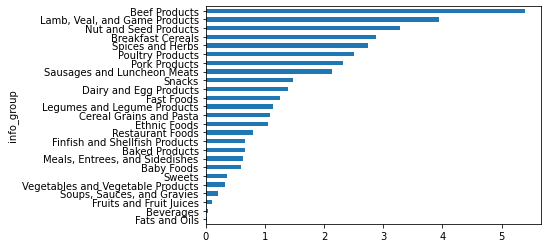

In [255]:
result['Zinc, Zn'].sort_values().plot(kind = 'barh')

In [256]:
# Now here we will find the food that is most dense in nutrients

In [257]:
by_nutrient = nutri_info.groupby(['nutri_group','nutri_desc'])

by_nutrient

In [258]:
def get_maxi(x):
    return x.loc[x.value.idxmax()]



In [259]:
# Now after this they did a little jiggery but we got it and have explained it

In [260]:
max_foods_og = by_nutrient.apply(get_maxi)[['value','info_desc']]

# Now what basically is happening is that you are first applying the get_maxi on entire by_nutrient groupby object and then
# after the output that you get you are only selecting [['value','info_desc']] columns
# Now you can also break it and do in two separate steps by changing the order of the function applying and column selection
# as shown below 

In [261]:
max_foods = by_nutrient[['value','info_desc']]


max_foods = max_foods.apply(get_maxi)

max_foods


value  \
nutri_group nutri_desc                               
Amino Acids Alanine                          8.009   
            Arginine                         7.436   
            Aspartic acid                   10.203   
            Cystine                          1.307   
            Glutamic acid                   17.452   
...                                            ...   
Vitamins    Vitamin D2 (ergocalciferol)     28.100   
            Vitamin D3 (cholecalciferol)    27.400   
            Vitamin E (alpha-tocopherol)   149.400   
            Vitamin E, added                46.550   
            Vitamin K (phylloquinone)     1714.500   

                                                                                  info_desc  
nutri_group nutri_desc                                                                       
Amino Acids Alanine                                       Gelatins, dry powder, unsweetened  
            Arginine                                           Seeds, sesame flour, low-fat  
            Aspartic acid                                               Soy protein isolate  
            Cystine                            Seeds, cottonseed flour, low fat (glandless)  
            Glutamic acid                                               Soy protein isolate  
...                                                                                     ...  
Vitamins    Vitamin D2 (ergocalciferol)                             Mushrooms, maitake, raw  
            Vitamin D3 (cholecalciferol)                      Fish, halibut, Greenland, raw  
            Vitamin E (alpha-tocopherol)                                    Oil, wheat germ  
            Vitamin E, added              Cereals ready-to-eat, GENERAL MILLS, Multi-Gra...  
            Vitamin K (phylloquinone)                                  Spices, sage, ground  

[94 rows x 2 columns]

In [262]:
max_foods_temp = by_nutrient.apply(get_maxi)

max_foods_temp

value units  \
nutri_group nutri_desc                                     
Amino Acids Alanine                          8.009     g   
            Arginine                         7.436     g   
            Aspartic acid                   10.203     g   
            Cystine                          1.307     g   
            Glutamic acid                   17.452     g   
...                                            ...   ...   
Vitamins    Vitamin D2 (ergocalciferol)     28.100   mcg   
            Vitamin D3 (cholecalciferol)    27.400   mcg   
            Vitamin E (alpha-tocopherol)   149.400    mg   
            Vitamin E, added                46.550    mg   
            Vitamin K (phylloquinone)     1714.500   mcg   

                                                            nutri_desc  \
nutri_group nutri_desc                                                   
Amino Acids Alanine                                            Alanine   
            Arginine                                          Arginine   
            Aspartic acid                                Aspartic acid   
            Cystine                                            Cystine   
            Glutamic acid                                Glutamic acid   
...                                                                ...   
Vitamins    Vitamin D2 (ergocalciferol)    Vitamin D2 (ergocalciferol)   
            Vitamin D3 (cholecalciferol)  Vitamin D3 (cholecalciferol)   
            Vitamin E (alpha-tocopherol)  Vitamin E (alpha-tocopherol)   
            Vitamin E, added                          Vitamin E, added   
            Vitamin K (phylloquinone)        Vitamin K (phylloquinone)   

                                          nutri_group     id  \
nutri_group nutri_desc                                         
Amino Acids Alanine                       Amino Acids  19177   
            Arginine                      Amino Acids  12033   
            Aspartic acid                 Amino Acids  16122   
            Cystine                       Amino Acids  12008   
            Glutamic acid                 Amino Acids  16122   
...                                               ...    ...   
Vitamins    Vitamin D2 (ergocalciferol)      Vitamins  11993   
            Vitamin D3 (cholecalciferol)     Vitamins  15038   
            Vitamin E (alpha-tocopherol)     Vitamins   4038   
            Vitamin E, added                 Vitamins   8087   
            Vitamin K (phylloquinone)        Vitamins   2038   

                                                                                  info_desc  \
nutri_group nutri_desc                                                                        
Amino Acids Alanine                                       Gelatins, dry powder, unsweetened   
            Arginine                                           Seeds, sesame flour, low-fat   
            Aspartic acid                                               Soy protein isolate   
            Cystine                            Seeds, cottonseed flour, low fat (glandless)   
            Glutamic acid                                               Soy protein isolate   
...                                                                                     ...   
Vitamins    Vitamin D2 (ergocalciferol)                             Mushrooms, maitake, raw   
            Vitamin D3 (cholecalciferol)                      Fish, halibut, Greenland, raw   
            Vitamin E (alpha-tocopherol)                                    Oil, wheat germ   
            Vitamin E, added              Cereals ready-to-eat, GENERAL MILLS, Multi-Gra...   
            Vitamin K (phylloquinone)                                  Spices, sage, ground   

                                                                 info_group  \
nutri_group nutri_desc                                                        
Amino Acids Alanine                                                  Sweet

In [263]:
max_foods_temp = max_foods_temp[['value','info_desc']]

max_foods_temp

value  \
nutri_group nutri_desc                               
Amino Acids Alanine                          8.009   
            Arginine                         7.436   
            Aspartic acid                   10.203   
            Cystine                          1.307   
            Glutamic acid                   17.452   
...                                            ...   
Vitamins    Vitamin D2 (ergocalciferol)     28.100   
            Vitamin D3 (cholecalciferol)    27.400   
            Vitamin E (alpha-tocopherol)   149.400   
            Vitamin E, added                46.550   
            Vitamin K (phylloquinone)     1714.500   

                                                                                  info_desc  
nutri_group nutri_desc                                                                       
Amino Acids Alanine                                       Gelatins, dry powder, unsweetened  
            Arginine                                           Seeds, sesame flour, low-fat  
            Aspartic acid                                               Soy protein isolate  
            Cystine                            Seeds, cottonseed flour, low fat (glandless)  
            Glutamic acid                                               Soy protein isolate  
...                                                                                     ...  
Vitamins    Vitamin D2 (ergocalciferol)                             Mushrooms, maitake, raw  
            Vitamin D3 (cholecalciferol)                      Fish, halibut, Greenland, raw  
            Vitamin E (alpha-tocopherol)                                    Oil, wheat germ  
            Vitamin E, added              Cereals ready-to-eat, GENERAL MILLS, Multi-Gra...  
            Vitamin K (phylloquinone)                                  Spices, sage, ground  

[94 rows x 2 columns]

In [264]:
# Now let's dispay it more properly by selecting only a few rows

In [265]:
max_foods.loc['Amino Acids']['info_desc']

nutri_desc
Alanine                           Gelatins, dry powder, unsweetened
Arginine                               Seeds, sesame flour, low-fat
Aspartic acid                                   Soy protein isolate
Cystine                Seeds, cottonseed flour, low fat (glandless)
Glutamic acid                                   Soy protein isolate
Glycine                           Gelatins, dry powder, unsweetened
Histidine                Whale, beluga, meat, dried (Alaska Native)
Hydroxyproline    KENTUCKY FRIED CHICKEN, Fried Chicken, ORIGINA...
Isoleucine        Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Leucine           Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Lysine            Seal, bearded (Oogruk), meat, dried (Alaska Na...
Methionine                    Fish, cod, Atlantic, dried and salted
Phenylalanine     Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Proline                           Gelatins, dry powder, unsweetened
Serine            Soy protein isolate

In [266]:
max_foods_temp.loc['Amino Acids']['info_desc']

nutri_desc
Alanine                           Gelatins, dry powder, unsweetened
Arginine                               Seeds, sesame flour, low-fat
Aspartic acid                                   Soy protein isolate
Cystine                Seeds, cottonseed flour, low fat (glandless)
Glutamic acid                                   Soy protein isolate
Glycine                           Gelatins, dry powder, unsweetened
Histidine                Whale, beluga, meat, dried (Alaska Native)
Hydroxyproline    KENTUCKY FRIED CHICKEN, Fried Chicken, ORIGINA...
Isoleucine        Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Leucine           Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Lysine            Seal, bearded (Oogruk), meat, dried (Alaska Na...
Methionine                    Fish, cod, Atlantic, dried and salted
Phenylalanine     Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Proline                           Gelatins, dry powder, unsweetened
Serine            Soy protein isolate

In [267]:
type(max_foods_og)

pandas.core.frame.DataFrame

In [268]:
type(max_foods)

pandas.core.frame.DataFrame

In [269]:
max_foods_og.loc['Amino Acids']['info_desc']

nutri_desc
Alanine                           Gelatins, dry powder, unsweetened
Arginine                               Seeds, sesame flour, low-fat
Aspartic acid                                   Soy protein isolate
Cystine                Seeds, cottonseed flour, low fat (glandless)
Glutamic acid                                   Soy protein isolate
Glycine                           Gelatins, dry powder, unsweetened
Histidine                Whale, beluga, meat, dried (Alaska Native)
Hydroxyproline    KENTUCKY FRIED CHICKEN, Fried Chicken, ORIGINA...
Isoleucine        Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Leucine           Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Lysine            Seal, bearded (Oogruk), meat, dried (Alaska Na...
Methionine                    Fish, cod, Atlantic, dried and salted
Phenylalanine     Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Proline                           Gelatins, dry powder, unsweetened
Serine            Soy protein isolate

## 13.5 Federal Election Commission Database

In [270]:
# Now we will see a database containing data about the contributors to US election

In [271]:
fedecn = pd.read_csv('datasets/fec/P00000001-ALL.csv',low_memory=False)

fedecn

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num
0,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,250.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166
1,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,50.0,23-JUN-11,NaN,NaN,NaN,SA17A,736166
2,C00410118,P20002978,"Bachmann, Michelle","SMITH, LANIER",LANETT,AL,368633403,INFORMATION REQUESTED,INFORMATION REQUESTED,250.0,05-JUL-11,NaN,NaN,NaN,SA17A,749073
3,C00410118,P20002978,"Bachmann, Michelle","BLEVINS, DARONDA",PIGGOTT,AR,724548253,NONE,RETIRED,250.0,01-AUG-11,NaN,NaN,NaN,SA17A,749073
4,C00410118,P20002978,"Bachmann, Michelle","WARDENBURG, HAROLD",HOT SPRINGS NATION,AR,719016467,NONE,RETIRED,300.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001726,C00500587,P20003281,"Perry, Rick","GORMAN, CHRIS D. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,5000.0,29-SEP-11,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,NaN,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,SA17A,751678
1001727,C00500587,P20003281,"Perry, Rick","DUFFY, DAVID A. MR.",INFO REQUESTED,XX,99999,DUFFY EQUIPMENT COMPANY INC.,BUSINESS OWNER,2500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678
1001728,C00500587,P20003281,"Perry, Rick","GRANE, BRYAN F. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,500.0,29-SEP-11,NaN,NaN,NaN,SA17A,751678
1001729,C00500587,P20003281,"Perry, Rick","TOLBERT, DARYL MR.",INFO REQUESTED,XX,99999,T.A.C.C.,LONGWALL MAINTENANCE FOREMAN,500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678


In [272]:
fedecn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001731 entries, 0 to 1001730
Data columns (total 16 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   cmte_id            1001731 non-null  object 
 1   cand_id            1001731 non-null  object 
 2   cand_nm            1001731 non-null  object 
 3   contbr_nm          1001731 non-null  object 
 4   contbr_city        1001712 non-null  object 
 5   contbr_st          1001727 non-null  object 
 6   contbr_zip         1001620 non-null  object 
 7   contbr_employer    988002 non-null   object 
 8   contbr_occupation  993301 non-null   object 
 9   contb_receipt_amt  1001731 non-null  float64
 10  contb_receipt_dt   1001731 non-null  object 
 11  receipt_desc       14166 non-null    object 
 12  memo_cd            92482 non-null    object 
 13  memo_text          97770 non-null    object 
 14  form_tp            1001731 non-null  object 
 15  file_num           1001731 non-n

In [273]:
# Let's see a sample record for some insight

In [274]:
fedecn.iloc[123444]

cmte_id                        C00431445
cand_id                        P80003338
cand_nm                    Obama, Barack
contbr_nm            ROBINSON, PRISCILLA
contbr_city                       TUCSON
contbr_st                             AZ
contbr_zip                         85719
contbr_employer                  RETIRED
contbr_occupation                RETIRED
contb_receipt_amt                  100.0
contb_receipt_dt               09-NOV-11
receipt_desc                         NaN
memo_cd                              NaN
memo_text                            NaN
form_tp                            SA17A
file_num                          772372
Name: 123444, dtype: object

In [275]:
# Let's get the list of unique candidates

In [276]:
fedecn['cand_id'].unique()

array(['P20002978', 'P80003353', 'P80003338', 'P20002523', 'P20002556',
       'P20002671', 'P80000748', 'P20002721', 'P00003608', 'P60003654',
       'P20003109', 'P20003067', 'P20003281'], dtype=object)

In [277]:
unq_cands = fedecn['cand_nm'].unique()

unq_cands

array(['Bachmann, Michelle', 'Romney, Mitt', 'Obama, Barack',
       "Roemer, Charles E. 'Buddy' III", 'Pawlenty, Timothy',
       'Johnson, Gary Earl', 'Paul, Ron', 'Santorum, Rick',
       'Cain, Herman', 'Gingrich, Newt', 'McCotter, Thaddeus G',
       'Huntsman, Jon', 'Perry, Rick'], dtype=object)

In [278]:
# Now let's start finding the party affiliations
# IMP Note:- These affiliations of candidates are from the 2012, they have changed their parties now

In [279]:
parties = {'Bachmann, Michelle':'Republican',
           'Cain, Herman':'Republican',
           'Gingrich, Newt':'Republican',
           'Huntsman, Jon':'Republican',
           'Johnson, Gary Earl':'Republican',
           'McCotter, Thaddeus G':'Republican',
           'Obama, Barack':'Democrat',
           'Paul, Ron':'Republican',
           'Pawlenty, Timothy':'Republican',
            'Perry, Rick':'Republican',
           "Roemer, Charles E. 'Buddy' III":'Republican',
           'Romney, Mitt':'Republican',
           'Santorum, Rick':'Republican'
           
                     }

In [280]:
parties

{'Bachmann, Michelle': 'Republican',
 'Cain, Herman': 'Republican',
 'Gingrich, Newt': 'Republican',
 'Huntsman, Jon': 'Republican',
 'Johnson, Gary Earl': 'Republican',
 'McCotter, Thaddeus G': 'Republican',
 'Obama, Barack': 'Democrat',
 'Paul, Ron': 'Republican',
 'Pawlenty, Timothy': 'Republican',
 'Perry, Rick': 'Republican',
 "Roemer, Charles E. 'Buddy' III": 'Republican',
 'Romney, Mitt': 'Republican',
 'Santorum, Rick': 'Republican'}

In [281]:
# Now let's map the parties

In [282]:
fedecn['cand_nm'][123:126]

123    Bachmann, Michelle
124    Bachmann, Michelle
125    Bachmann, Michelle
Name: cand_nm, dtype: object

In [283]:
fedecn['cand_nm'][123456:123553]

123456    Obama, Barack
123457    Obama, Barack
123458    Obama, Barack
123459    Obama, Barack
123460    Obama, Barack
              ...      
123548    Obama, Barack
123549    Obama, Barack
123550    Obama, Barack
123551    Obama, Barack
123552    Obama, Barack
Name: cand_nm, Length: 97, dtype: object

In [284]:
fedecn['cand_nm'][123456:123553].map(parties)

123456    Democrat
123457    Democrat
123458    Democrat
123459    Democrat
123460    Democrat
            ...   
123548    Democrat
123549    Democrat
123550    Democrat
123551    Democrat
123552    Democrat
Name: cand_nm, Length: 97, dtype: object

In [285]:
# Now let's add it as a column

In [286]:
fedecn['party'] = fedecn['cand_nm'].map(parties)

fedecn

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num,party
0,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,250.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
1,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,50.0,23-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
2,C00410118,P20002978,"Bachmann, Michelle","SMITH, LANIER",LANETT,AL,368633403,INFORMATION REQUESTED,INFORMATION REQUESTED,250.0,05-JUL-11,NaN,NaN,NaN,SA17A,749073,Republican
3,C00410118,P20002978,"Bachmann, Michelle","BLEVINS, DARONDA",PIGGOTT,AR,724548253,NONE,RETIRED,250.0,01-AUG-11,NaN,NaN,NaN,SA17A,749073,Republican
4,C00410118,P20002978,"Bachmann, Michelle","WARDENBURG, HAROLD",HOT SPRINGS NATION,AR,719016467,NONE,RETIRED,300.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001726,C00500587,P20003281,"Perry, Rick","GORMAN, CHRIS D. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,5000.0,29-SEP-11,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,NaN,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,SA17A,751678,Republican
1001727,C00500587,P20003281,"Perry, Rick","DUFFY, DAVID A. MR.",INFO REQUESTED,XX,99999,DUFFY EQUIPMENT COMPANY INC.,BUSINESS OWNER,2500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001728,C00500587,P20003281,"Perry, Rick","GRANE, BRYAN F. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,500.0,29-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001729,C00500587,P20003281,"Perry, Rick","TOLBERT, DARYL MR.",INFO REQUESTED,XX,99999,T.A.C.C.,LONGWALL MAINTENANCE FOREMAN,500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican


In [287]:

fedecn['party'].value_counts()

Democrat      593746
Republican    407985
Name: party, dtype: int64

In [288]:
# Now this contribution also contains the refund

In [289]:
test = pd.DataFrame({'value':['ek','do','teen','chaar','paanch'],
                     'saamaan':['one','two','three','four','five'],
                     'asli':[1,2,3,4,5]
                    })

test


,value,saamaan,asli
0,ek,one,1
1,do,two,2
2,teen,three,3
3,chaar,four,4
4,paanch,five,5


In [290]:
test['asli'] > 2

0    False
1    False
2     True
3     True
4     True
Name: asli, dtype: bool

In [291]:
test['asli'] = test[test['asli'] > 2]

test

,value,saamaan,asli
0,ek,one,NaN
1,do,two,NaN
2,teen,three,teen
3,chaar,four,chaar
4,paanch,five,paanch


In [292]:
# test = test[test['asli'] > 2]

# test

In [293]:
# Now all the above things were done to prove a point that if you want to manipulate one column of a DataFrame and
# completely change the values it is best to do test = test[test['asli'] > 2]
#  You should not do test['asli'] = test[test['asli'] > 2]


In [294]:
# Now back to contribution, let's filter the data to only donations and no refund

In [295]:
fedecn[fedecn['contb_receipt_amt'] < 0]

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num,party
41,C00410118,P20002978,"Bachmann, Michelle","MINNIS, RITA",MILPITAS,CA,950357610,NaN,NaN,-1500.0,20-JUN-11,Refund,NaN,NaN,SB28A,736166,Republican
264,C00410118,P20002978,"Bachmann, Michelle","BISHOP, GERARD",WESTHAMPTON BEACH,NY,119780366,NaN,NaN,-1700.0,28-JUN-11,Refund,NaN,NaN,SB28A,736166,Republican
752,C00431171,P80003353,"Romney, Mitt","KNIGHT, RENA",MERIDIANVILLE,AL,35759,NaN,NaN,-60.0,07-MAR-12,Refund,NaN,NaN,SB28A,780128,Republican
885,C00431171,P80003353,"Romney, Mitt","HENDERSON, RONALD E. DR.",MOUNTAIN BRK,AL,352132325,RETIRED,RETIRED,-150.0,06-FEB-12,REATTRIBUTION TO SPOUSE,X,REATTRIBUTION TO SPOUSE,SA17A,780124,Republican
1033,C00431171,P80003353,"Romney, Mitt","SELLERS, LEE",MONTGOMERY,AL,36111,NaN,NaN,-120.0,20-JAN-12,Refund,NaN,NaN,SB28A,771933,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001703,C00500587,P20003281,"Perry, Rick","NELSON, HOWARD L. MR.",MORGANTOWN,WV,265082541,SWANSON INDUSTRIES,C.F.O.,-2500.0,01-OCT-11,REATTRIBUTION TO SPOUSE,X,REATTRIBUTION TO SPOUSE,SA17A,772060,Republican
1001704,C00500587,P20003281,"Perry, Rick","PHILLIPS, JIMMY D. MR.",BECKLEY,WV,258011601,PHILLIPS MACHINE SERVICES,EXECUTIVE,-2500.0,28-NOV-11,REDESIGNATION TO GENERAL,X,REDESIGNATION TO GENERAL,SA17A,772060,Republican
1001707,C00500587,P20003281,"Perry, Rick","BEVILOCK, JOHN C. MR.",GRAFTON,WV,263549332,DAVID STANLEY COMPANY,SALES,-2500.0,08-OCT-11,REATTRIBUTION TO SPOUSE,X,REATTRIBUTION TO SPOUSE,SA17A,772060,Republican
1001709,C00500587,P20003281,"Perry, Rick","HAYHURST, JAMES W. MR.",WHEELING,WV,260035764,DAVID STANLEY COMPANY,SALES,-2500.0,09-OCT-11,REATTRIBUTION TO SPOUSE,X,REATTRIBUTION TO SPOUSE,SA17A,772060,Republican


In [296]:
fedecn = fedecn[fedecn['contb_receipt_amt'] > 0]

fedecn

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num,party
0,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,250.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
1,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,50.0,23-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
2,C00410118,P20002978,"Bachmann, Michelle","SMITH, LANIER",LANETT,AL,368633403,INFORMATION REQUESTED,INFORMATION REQUESTED,250.0,05-JUL-11,NaN,NaN,NaN,SA17A,749073,Republican
3,C00410118,P20002978,"Bachmann, Michelle","BLEVINS, DARONDA",PIGGOTT,AR,724548253,NONE,RETIRED,250.0,01-AUG-11,NaN,NaN,NaN,SA17A,749073,Republican
4,C00410118,P20002978,"Bachmann, Michelle","WARDENBURG, HAROLD",HOT SPRINGS NATION,AR,719016467,NONE,RETIRED,300.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001726,C00500587,P20003281,"Perry, Rick","GORMAN, CHRIS D. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,5000.0,29-SEP-11,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,NaN,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,SA17A,751678,Republican
1001727,C00500587,P20003281,"Perry, Rick","DUFFY, DAVID A. MR.",INFO REQUESTED,XX,99999,DUFFY EQUIPMENT COMPANY INC.,BUSINESS OWNER,2500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001728,C00500587,P20003281,"Perry, Rick","GRANE, BRYAN F. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,500.0,29-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001729,C00500587,P20003281,"Perry, Rick","TOLBERT, DARYL MR.",INFO REQUESTED,XX,99999,T.A.C.C.,LONGWALL MAINTENANCE FOREMAN,500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican


In [297]:
# Finally let's make a subset data and keep the data limited to barack and mitt as they were the top contenders

In [298]:
fedecn_bar_mit = fedecn[fedecn['cand_nm'].isin(['Obama, Barack','Romney, Mitt'])]

fedecn_bar_mit

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num,party
411,C00431171,P80003353,"Romney, Mitt","ELDERBAUM, WILLIAM",DPO,AA,340230183,US GOVERNMENT,FOREIGN SERVICE OFFICER,25.0,01-FEB-12,NaN,NaN,NaN,SA17A,780124,Republican
412,C00431171,P80003353,"Romney, Mitt","ELDERBAUM, WILLIAM",DPO,AA,340230183,US GOVERNMENT,FOREIGN SERVICE OFFICER,110.0,01-FEB-12,NaN,NaN,NaN,SA17A,780124,Republican
413,C00431171,P80003353,"Romney, Mitt","CARLSEN, RICHARD",APO,AE,091280020,DEFENSE INTELLIGENCE AGENCY,INTELLIGENCE ANALYST,250.0,13-APR-12,NaN,NaN,NaN,SA17A,785689,Republican
414,C00431171,P80003353,"Romney, Mitt","DELUCA, PIERRE",APO,AE,091280005,CISCO,ENGINEER,30.0,21-AUG-11,NaN,NaN,NaN,SA17A,760261,Republican
415,C00431171,P80003353,"Romney, Mitt","SARGENT, MICHAEL",APO,AE,090120092,RAYTHEON TECHNICAL SERVICES CORP,COMPUTER SYSTEMS ENGINEER,100.0,07-MAR-12,NaN,NaN,NaN,SA17A,780128,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
701381,C00431445,P80003338,"Obama, Barack","MOUNTS, ROBERT",APO,ZZ,962043077,HQ USFK (FKDC-SA),GS-15 INTERNATIONAL RELATIONS OFFICER,25.0,26-FEB-12,NaN,NaN,NaN,SA17A,787803,Democrat
701382,C00431445,P80003338,"Obama, Barack","TAITANO, TYRONE",HAGATNA,ZZ,969323373,NOT EMPLOYED,RETIRED,250.0,20-JAN-12,NaN,NaN,NaN,SA17A,775668,Democrat
701383,C00431445,P80003338,"Obama, Barack","TUCKER, PAMELA",APO,ZZ,963190030,DODEA,EDUCATOR,3.0,20-JAN-12,NaN,NaN,NaN,SA17A,775668,Democrat
701384,C00431445,P80003338,"Obama, Barack","MOUNTS, ROBERT",APO,ZZ,962043077,HQ USFK (FKDC-SA),GS-15 INTERNATIONAL RELATIONS OFFICER,25.0,26-APR-12,NaN,NaN,NaN,SA17A,785239,Democrat


### Donation Statistics by Occupation and Employer

In [299]:
fedecn

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num,party
0,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,250.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
1,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,50.0,23-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
2,C00410118,P20002978,"Bachmann, Michelle","SMITH, LANIER",LANETT,AL,368633403,INFORMATION REQUESTED,INFORMATION REQUESTED,250.0,05-JUL-11,NaN,NaN,NaN,SA17A,749073,Republican
3,C00410118,P20002978,"Bachmann, Michelle","BLEVINS, DARONDA",PIGGOTT,AR,724548253,NONE,RETIRED,250.0,01-AUG-11,NaN,NaN,NaN,SA17A,749073,Republican
4,C00410118,P20002978,"Bachmann, Michelle","WARDENBURG, HAROLD",HOT SPRINGS NATION,AR,719016467,NONE,RETIRED,300.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001726,C00500587,P20003281,"Perry, Rick","GORMAN, CHRIS D. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,5000.0,29-SEP-11,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,NaN,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,SA17A,751678,Republican
1001727,C00500587,P20003281,"Perry, Rick","DUFFY, DAVID A. MR.",INFO REQUESTED,XX,99999,DUFFY EQUIPMENT COMPANY INC.,BUSINESS OWNER,2500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001728,C00500587,P20003281,"Perry, Rick","GRANE, BRYAN F. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,500.0,29-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001729,C00500587,P20003281,"Perry, Rick","TOLBERT, DARYL MR.",INFO REQUESTED,XX,99999,T.A.C.C.,LONGWALL MAINTENANCE FOREMAN,500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican


In [300]:
# Now from a research it was proved that professionals of certain occupation donated money to different groups
# like attorneys gave more money to democrats where as business-owners donated more to republicans

In [301]:
fedecn.loc[:,'contbr_nm']

0                 HARVEY, WILLIAM
1                 HARVEY, WILLIAM
2                   SMITH, LANIER
3                BLEVINS, DARONDA
4              WARDENBURG, HAROLD
                    ...          
1001726      GORMAN, CHRIS D. MR.
1001727       DUFFY, DAVID A. MR.
1001728       GRANE, BRYAN F. MR.
1001729        TOLBERT, DARYL MR.
1001730    ANDERSON, MARILEE MRS.
Name: contbr_nm, Length: 991475, dtype: object

In [302]:
fedecn['contbr_occupation']

0                                         RETIRED
1                                         RETIRED
2                           INFORMATION REQUESTED
3                                         RETIRED
4                                         RETIRED
                            ...                  
1001726    INFORMATION REQUESTED PER BEST EFFORTS
1001727                            BUSINESS OWNER
1001728    INFORMATION REQUESTED PER BEST EFFORTS
1001729              LONGWALL MAINTENANCE FOREMAN
1001730    INFORMATION REQUESTED PER BEST EFFORTS
Name: contbr_occupation, Length: 991475, dtype: object

In [303]:
ff = dict(fedecn['contbr_occupation'].value_counts())

ff.keys()
ll = []
for f in ff.keys():
    if f.startswith('INFORMATION'):
        if f not in ll:
            ll.append(f)


        

    
ll.index('INFORMATION REQUESTED')
ll

['INFORMATION REQUESTED',
 'INFORMATION REQUESTED PER BEST EFFORTS',
 'INFORMATION REQUESTED (BEST EFFORTS)',
 'INFORMATION TECHNOLOGY',
 'INFORMATION SECURITY',
 'INFORMATION SPECIALIST',
 'INFORMATION TECHNOLOGY CONSULTANT',
 'INFORMATION SYSTEMS MANAGER',
 'INFORMATION ASSURANCE SECURITY ANAL',
 'INFORMATION SYSTEMS',
 'INFORMATION SYSTEMS ANALYST',
 'INFORMATION TECHNOLOGY ANALYST',
 'INFORMATION TECHNOLOGY SPECIALIST',
 'INFORMATION ARCHITECT',
 'INFORMATION AND REFERRAL SPECIALIST',
 'INFORMATION MANAGER',
 'INFORMATION DEVELOPER',
 'INFORMATION REQUESTED BEST EFFORTS',
 'INFORMATION SYSTEMS CONSULTANT',
 'INFORMATION TECHNOLOGY MANAGER',
 'INFORMATION TECHNOLOGY AR',
 'INFORMATION COLLECTION',
 'INFORMATION SECURITY ENGINEER',
 'INFORMATION SOLUTION ARCHITECT',
 'INFORMATION SECURITY OFFICER',
 'INFORMATION TECH.',
 'INFORMATION ASSOCIATE',
 'INFORMATION MANAGEMENT SPECIALIST',
 'INFORMATION DESIGNER',
 'INFORMATION SECURITY ANALYST',
 'INFORMATION TECHNOLOGY ADMINISTRATOR',
 'I

In [304]:
# Now a lot of them refer to the same type, or there are many variants of one thing

In [305]:
# Here we will use the dict.get method which basically does not throw an error if it encounters a key that is not present
# in the dictionary

In [306]:
occ_mapping = {'INFORMATION REQUESTED':'NOT PROVIDED','INFORMATION REQUESTED PER BEST EFFORTS':'NOT PROVIDED',
               'INFORMATION REQUESTED (BEST EFFORTS)':'NOT PROVIDED','C.E.O':'CEO'}

In [307]:
def get_occ(x):
    # If no mapping found then return x
    return occ_mapping.get(x,x)

In [308]:
fedecn['contbr_occupation'] = fedecn['contbr_occupation'].map(get_occ)

fedecn

c:\python 3.7\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num,party
0,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,250.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
1,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,50.0,23-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
2,C00410118,P20002978,"Bachmann, Michelle","SMITH, LANIER",LANETT,AL,368633403,INFORMATION REQUESTED,NOT PROVIDED,250.0,05-JUL-11,NaN,NaN,NaN,SA17A,749073,Republican
3,C00410118,P20002978,"Bachmann, Michelle","BLEVINS, DARONDA",PIGGOTT,AR,724548253,NONE,RETIRED,250.0,01-AUG-11,NaN,NaN,NaN,SA17A,749073,Republican
4,C00410118,P20002978,"Bachmann, Michelle","WARDENBURG, HAROLD",HOT SPRINGS NATION,AR,719016467,NONE,RETIRED,300.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001726,C00500587,P20003281,"Perry, Rick","GORMAN, CHRIS D. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,NOT PROVIDED,5000.0,29-SEP-11,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,NaN,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,SA17A,751678,Republican
1001727,C00500587,P20003281,"Perry, Rick","DUFFY, DAVID A. MR.",INFO REQUESTED,XX,99999,DUFFY EQUIPMENT COMPANY INC.,BUSINESS OWNER,2500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001728,C00500587,P20003281,"Perry, Rick","GRANE, BRYAN F. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,NOT PROVIDED,500.0,29-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001729,C00500587,P20003281,"Perry, Rick","TOLBERT, DARYL MR.",INFO REQUESTED,XX,99999,T.A.C.C.,LONGWALL MAINTENANCE FOREMAN,500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican


In [309]:
# Let's do the same for the employee data as well

In [310]:
emp_mapping = {'INFORMATION REQUESTED':'NOT PROVIDED','INFORMATION REQUESTED PER BEST EFFORTS':'NOT PROVIDED',
              'SELF':'SELF-EMPLOYED',
              'SELF EMPLOYED':'SELF-EMPLOYED'}

In [311]:
def get_emp(x):
    return emp_mapping.get(x,x)

In [312]:
fedecn['contbr_employer'] = fedecn['contbr_employer'].map(get_emp)


fedecn

c:\python 3.7\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num,party
0,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,250.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
1,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290,RETIRED,RETIRED,50.0,23-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
2,C00410118,P20002978,"Bachmann, Michelle","SMITH, LANIER",LANETT,AL,368633403,NOT PROVIDED,NOT PROVIDED,250.0,05-JUL-11,NaN,NaN,NaN,SA17A,749073,Republican
3,C00410118,P20002978,"Bachmann, Michelle","BLEVINS, DARONDA",PIGGOTT,AR,724548253,NONE,RETIRED,250.0,01-AUG-11,NaN,NaN,NaN,SA17A,749073,Republican
4,C00410118,P20002978,"Bachmann, Michelle","WARDENBURG, HAROLD",HOT SPRINGS NATION,AR,719016467,NONE,RETIRED,300.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001726,C00500587,P20003281,"Perry, Rick","GORMAN, CHRIS D. MR.",INFO REQUESTED,XX,99999,NOT PROVIDED,NOT PROVIDED,5000.0,29-SEP-11,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,NaN,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,SA17A,751678,Republican
1001727,C00500587,P20003281,"Perry, Rick","DUFFY, DAVID A. MR.",INFO REQUESTED,XX,99999,DUFFY EQUIPMENT COMPANY INC.,BUSINESS OWNER,2500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001728,C00500587,P20003281,"Perry, Rick","GRANE, BRYAN F. MR.",INFO REQUESTED,XX,99999,NOT PROVIDED,NOT PROVIDED,500.0,29-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican
1001729,C00500587,P20003281,"Perry, Rick","TOLBERT, DARYL MR.",INFO REQUESTED,XX,99999,T.A.C.C.,LONGWALL MAINTENANCE FOREMAN,500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678,Republican


In [313]:
# Now let's use pivot table and visualize the data

In [314]:
by_occ = fedecn.pivot_table(values='contb_receipt_amt',
                           index = 'contbr_occupation',
                           columns='party',aggfunc='sum')

by_occ

party,Democrat,Republican
contbr_occupation,,
MIXED-MEDIA ARTIST / STORYTELLER,100.0,NaN
AREA VICE PRESIDENT,250.0,NaN
RESEARCH ASSOCIATE,100.0,NaN
TEACHER,500.0,NaN
THERAPIST,3900.0,NaN
...,...,...
ZOOKEEPER,35.0,NaN
ZOOLOGIST,400.0,NaN
ZOOLOGY EDUCATION,25.0,NaN


In [315]:
# Now let's look at high donation amounts and also professionals of which occupant gave it

In [316]:
don_over_2mn = by_occ[by_occ.sum(axis='columns')> 2000000]

don_over_2mn

party,Democrat,Republican
contbr_occupation,,
ATTORNEY,11141982.97,7.477194e+06
C.E.O.,1690.00,2.592983e+06
CEO,2074284.79,1.640758e+06
CONSULTANT,2459912.71,2.544725e+06
ENGINEER,951525.55,1.818374e+06
EXECUTIVE,1355161.05,4.138850e+06
HOMEMAKER,4248875.80,1.363428e+07
INVESTOR,884133.00,2.431769e+06
LAWYER,3160478.87,3.912243e+05


In [317]:
# Let's do the plotting

<AxesSubplot:ylabel='contbr_occupation'>

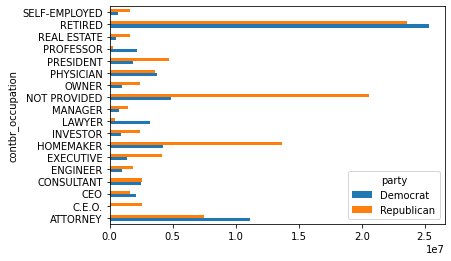

In [318]:
don_over_2mn.plot(kind = 'barh')

In [319]:
# Now let's deepdive further into this and see who and what were the donor occupations of the ones who donated to
# obama and romney

In [320]:
def get_romney_obama_top_amts(grouper,key,n=3):
    print('this the grouper\n',grouper,'khatam')
    total_donors = grouper.groupby(key)['contb_receipt_amt'].sum()
    return total_donors.nlargest(n)

In [321]:

grp_me = fedecn_bar_mit.groupby('cand_nm')

grp_me.apply(get_romney_obama_top_amts,'contbr_occupation',7)

# Now here, the groupby and the apply function is used in a little different way, as you can see that the instead of applying the 
# apply method on a DataFrame we are applying it on a groupby object of the DataFrame so what you see above as 
#grp_me = fedecn_bar_mit.groupby('cand_nm')
#grp_me.apply(get_romney_obama_top_amts,'contbr_occupation',7)

# is actually being passed in the following format
# fedecn_bar_mit.groupby('cand_nm').apply(get_romney_obama_top_amts,'contbr_occupation',7)
# So what is happening is that first the groupby part is done and the data gets divided on basis of cand_nm
# then on the apply method the entire DataFrame is passed without any modification or grouping by done to it
# then the get_romney_obama_top_amts method does the operation in the method's block
# then the value returned is fitted against the groupby block grouped on basis of 'cand_nm'
# we have used the way mentioned in the line above to prove that the result is the same



this the grouper
           cmte_id    cand_id        cand_nm            contbr_nm  \
107640  C00431445  P80003338  Obama, Barack        BARNARD, ERIC   
107641  C00431445  P80003338  Obama, Barack       HESTER, COREEN   
107642  C00431445  P80003338  Obama, Barack  ST. HILAIRE, PIERRE   
107643  C00431445  P80003338  Obama, Barack  BRIDGEWATER, PAMELA   
107647  C00431445  P80003338  Obama, Barack        BARNARD, ERIC   
...           ...        ...            ...                  ...   
701381  C00431445  P80003338  Obama, Barack       MOUNTS, ROBERT   
701382  C00431445  P80003338  Obama, Barack      TAITANO, TYRONE   
701383  C00431445  P80003338  Obama, Barack       TUCKER, PAMELA   
701384  C00431445  P80003338  Obama, Barack       MOUNTS, ROBERT   
701385  C00431445  P80003338  Obama, Barack          NEAL, AMBER   

            contbr_city contbr_st contbr_zip  \
107640      ANDREWS AFB        AA      20762   
107641  LONDON NW8 9-NB        AA        NaN   
107642              A

cand_nm        contbr_occupation                     
Obama, Barack  RETIRED                                   25305116.38
               ATTORNEY                                  11141982.97
               INFORMATION REQUESTED                      4866973.96
               HOMEMAKER                                  4248875.80
               PHYSICIAN                                  3735124.94
               LAWYER                                     3160478.87
               CONSULTANT                                 2459912.71
Romney, Mitt   RETIRED                                   11508473.59
               INFORMATION REQUESTED PER BEST EFFORTS    11396894.84
               HOMEMAKER                                  8147446.22
               ATTORNEY                                   5364718.82
               PRESIDENT                                  2491244.89
               EXECUTIVE                                  2300947.03
               C.E.O.                            

In [322]:
fedecn_bar_mit

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num,party
411,C00431171,P80003353,"Romney, Mitt","ELDERBAUM, WILLIAM",DPO,AA,340230183,US GOVERNMENT,FOREIGN SERVICE OFFICER,25.0,01-FEB-12,NaN,NaN,NaN,SA17A,780124,Republican
412,C00431171,P80003353,"Romney, Mitt","ELDERBAUM, WILLIAM",DPO,AA,340230183,US GOVERNMENT,FOREIGN SERVICE OFFICER,110.0,01-FEB-12,NaN,NaN,NaN,SA17A,780124,Republican
413,C00431171,P80003353,"Romney, Mitt","CARLSEN, RICHARD",APO,AE,091280020,DEFENSE INTELLIGENCE AGENCY,INTELLIGENCE ANALYST,250.0,13-APR-12,NaN,NaN,NaN,SA17A,785689,Republican
414,C00431171,P80003353,"Romney, Mitt","DELUCA, PIERRE",APO,AE,091280005,CISCO,ENGINEER,30.0,21-AUG-11,NaN,NaN,NaN,SA17A,760261,Republican
415,C00431171,P80003353,"Romney, Mitt","SARGENT, MICHAEL",APO,AE,090120092,RAYTHEON TECHNICAL SERVICES CORP,COMPUTER SYSTEMS ENGINEER,100.0,07-MAR-12,NaN,NaN,NaN,SA17A,780128,Republican
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
701381,C00431445,P80003338,"Obama, Barack","MOUNTS, ROBERT",APO,ZZ,962043077,HQ USFK (FKDC-SA),GS-15 INTERNATIONAL RELATIONS OFFICER,25.0,26-FEB-12,NaN,NaN,NaN,SA17A,787803,Democrat
701382,C00431445,P80003338,"Obama, Barack","TAITANO, TYRONE",HAGATNA,ZZ,969323373,NOT EMPLOYED,RETIRED,250.0,20-JAN-12,NaN,NaN,NaN,SA17A,775668,Democrat
701383,C00431445,P80003338,"Obama, Barack","TUCKER, PAMELA",APO,ZZ,963190030,DODEA,EDUCATOR,3.0,20-JAN-12,NaN,NaN,NaN,SA17A,775668,Democrat
701384,C00431445,P80003338,"Obama, Barack","MOUNTS, ROBERT",APO,ZZ,962043077,HQ USFK (FKDC-SA),GS-15 INTERNATIONAL RELATIONS OFFICER,25.0,26-APR-12,NaN,NaN,NaN,SA17A,785239,Democrat


In [323]:
# Now all that what has happened above is nothing but groupby applied on two columns in an order, you can do the same
# differently as well

In [324]:
fedecn_bar_mit.groupby('cand_nm').apply(get_romney_obama_top_amts,'contbr_occupation',7)

this the grouper
           cmte_id    cand_id        cand_nm            contbr_nm  \
107640  C00431445  P80003338  Obama, Barack        BARNARD, ERIC   
107641  C00431445  P80003338  Obama, Barack       HESTER, COREEN   
107642  C00431445  P80003338  Obama, Barack  ST. HILAIRE, PIERRE   
107643  C00431445  P80003338  Obama, Barack  BRIDGEWATER, PAMELA   
107647  C00431445  P80003338  Obama, Barack        BARNARD, ERIC   
...           ...        ...            ...                  ...   
701381  C00431445  P80003338  Obama, Barack       MOUNTS, ROBERT   
701382  C00431445  P80003338  Obama, Barack      TAITANO, TYRONE   
701383  C00431445  P80003338  Obama, Barack       TUCKER, PAMELA   
701384  C00431445  P80003338  Obama, Barack       MOUNTS, ROBERT   
701385  C00431445  P80003338  Obama, Barack          NEAL, AMBER   

            contbr_city contbr_st contbr_zip  \
107640      ANDREWS AFB        AA      20762   
107641  LONDON NW8 9-NB        AA        NaN   
107642              A

cand_nm        contbr_occupation                     
Obama, Barack  RETIRED                                   25305116.38
               ATTORNEY                                  11141982.97
               INFORMATION REQUESTED                      4866973.96
               HOMEMAKER                                  4248875.80
               PHYSICIAN                                  3735124.94
               LAWYER                                     3160478.87
               CONSULTANT                                 2459912.71
Romney, Mitt   RETIRED                                   11508473.59
               INFORMATION REQUESTED PER BEST EFFORTS    11396894.84
               HOMEMAKER                                  8147446.22
               ATTORNEY                                   5364718.82
               PRESIDENT                                  2491244.89
               EXECUTIVE                                  2300947.03
               C.E.O.                            

### Bucketing Donation Amounts

In [325]:
# Now let's further analyse the data and divide it on basis of which candidates received which amounts of donation a lot


In [326]:
# We will first divide the data using the cut method

In [327]:
binn = np.array([0,1,10,100,1000,10000,1_00_000,1_000_000,10_000_000])

labels = pd.cut(fedecn_bar_mit['contb_receipt_amt'],binn)

labels

411         (10, 100]
412       (100, 1000]
413       (100, 1000]
414         (10, 100]
415         (10, 100]
             ...     
701381      (10, 100]
701382    (100, 1000]
701383        (1, 10]
701384      (10, 100]
701385    (100, 1000]
Name: contb_receipt_amt, Length: 694282, dtype: category
Categories (8, interval[int64]): [(0, 1] < (1, 10] < (10, 100] < (100, 1000] < (1000, 10000] < (10000, 100000] < (100000, 1000000] < (1000000, 10000000]]

In [328]:
# Now let's see the distribution

In [329]:
grp_don = fedecn_bar_mit.groupby(['cand_nm',labels])

In [330]:

grp_don.size().unstack(level=0)

cand_nm,"Obama, Barack","Romney, Mitt"
contb_receipt_amt,,
"(0, 1]",493,77
"(1, 10]",40070,3681
"(10, 100]",372280,31853
"(100, 1000]",153991,43357
"(1000, 10000]",22284,26186
"(10000, 100000]",2,1
"(100000, 1000000]",3,0
"(1000000, 10000000]",4,0


In [331]:
# As you can see that obama received more numbers of individual small donations. Now let's normalize the data and do plot

In [332]:
bucket_sums = grp_don['contb_receipt_amt'].sum().unstack(level = 0)


In [333]:
normie_bucket_sums = bucket_sums.div(bucket_sums.sum(axis='columns'),
                                    axis = 'index')

normie_bucket_sums

cand_nm,"Obama, Barack","Romney, Mitt"
contb_receipt_amt,,
"(0, 1]",0.805182,0.194818
"(1, 10]",0.918767,0.081233
"(10, 100]",0.910769,0.089231
"(100, 1000]",0.710176,0.289824
"(1000, 10000]",0.447326,0.552674
"(10000, 100000]",0.823120,0.176880
"(100000, 1000000]",1.000000,0.000000
"(1000000, 10000000]",1.000000,0.000000


In [334]:
# Now while plotting we will exclude the last two bins as they are'nt individual donations

<AxesSubplot:ylabel='contb_receipt_amt'>

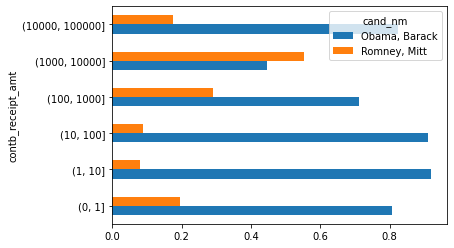

In [335]:
normie_bucket_sums[:-2].plot(kind = 'barh')

### Donation Stastics by State

In [336]:
# Now let's see which states gave more contribution and to which candidate

In [337]:
grp_end = fedecn_bar_mit.groupby(['cand_nm','contbr_st'])

In [339]:
total_end = grp_end['contb_receipt_amt'].sum().unstack(level = 0).fillna(grp_end['contb_receipt_amt'].mean())

total_end

cand_nm,"Obama, Barack","Romney, Mitt"
contbr_st,,
AA,56405.00,135.00
AB,2048.00,NaN
AE,42973.75,5680.00
AK,281840.15,86204.24
AL,543123.48,527303.51
...,...,...
WI,1130155.46,270316.32
WV,169154.47,126725.12
WY,194046.74,252595.84


In [340]:
# Let's get the relative percentage by dividing the total contribution amount per row for each candidate state wise

In [341]:
percent_end = total_end.div(total_end.sum(axis='columns'),axis= 'index')

percent_end

cand_nm,"Obama, Barack","Romney, Mitt"
contbr_st,,
AA,0.997612,0.002388
AB,1.000000,NaN
AE,0.883257,0.116743
AK,0.765778,0.234222
AL,0.507390,0.492610
...,...,...
WI,0.806982,0.193018
WV,0.571700,0.428300
WY,0.434456,0.565544


# The end, but it never really is.